# Project Two - Classifications

## Team Member Names:

Name 1: Rajeev Kumar  
Name 2: Araya Messa  
Name 3: Manjula Kottegoda

## Date : 03/12/2017

# 1. Classification Task

## Objective and Background (Business Understanding)
 
The objective of the project is to build upon the analysis done thus far on the European soccer league data by performing additional regression and classification modeling techniques with the goal of gaining a better understanding of <b><u>*the English soccer league*</u></b> match outcomes. Then end goal, as before, will be predicting a home win with a reasonable accuracy as well as predicting the margin of the score for a given game. The application of the model in the real world being sports betting based on outcome or spread.

Classification will be performed using the KNN, KNN w/ PCA, Random Forest, AdaBoost, AdaBoost w/ PCA, Gaussian NB (Naive Bayes), Gaussian NB w/ PCA techniques. And Regression performed using Random Forest regression, KNN regression, Gradient Boosting regression techniques. The Dataset of this study consists of games played in English soccer leagues for the time span of 2008 - 2016. The Dataset was gathered from the European soccer league dataset published in Kaggle [1].

In addition to classifying we will closely examine how the separation of testing and training data was performed within the context of this problem. We would also examine how the classifications were refined by manipulating certain parameters such as the hyperparameters to gain an optimally generalized model. The end goal is to produce a model that can be deployed to predict real world games played in the European Soccer leagues.

## Data Descriptions (Data Understanding)
 
First we import the data from the sqllite database consisting of the following tables.
 
The dataset consists of a SQLite database with the following tables.
 
#### Country
Consists of the countries that participates in the leagues that makes up the dataset
#### League
List of 10 European leagues such as English Premier League , Bundesliga and Spanish LIGA
#### Match
This is a large data table consisting of almost 26,000 matches played between 2008-2016 seasons. The dataset is rich in information that covers a wide variety of attributes as well as betting odds set forth that major bookies across the globe. Some interesting attributes of this dataset consists of
#### League
Season
Home Team Score
Away Team Score
All players : All players in lineup
Goal attempt details: XML data consisting of players who attempted to score with result
Penalties
#### Player
This tables gives some basic statistics of the players such as,
Name
Player IDs
Birthday to derive age
Weight
Height
#### Player Attributes
This table breaks down the players into minute details on a multitude of physical and skill attributes. Following are some interesting attributes in this table are
Overall Rating of player
Potential of player
Left-footed or Right-footed
Crossing
Heading accuracy
Dribbling
Various Kicking accuracies
Ball control
Speed
Stamina
Balance
Aggression
Various Defensive traits
#### Team
Teams names
#### Team Attributes
Lists a variety of offensive and defensive attributes as well as some classifications
buildUpPlaySpeed
buildUpPlaySpeedClass
buildUpPlayDribbling
buildUpPlayDribblingClass
buildUpPlayPassing
buildUpPlayPassingClass
buildUpPlayPositioningClass
chanceCreationPassing
chanceCreationPassingClass
chanceCreationCrossing
chanceCreationCrossingClass
chanceCreationShooting
chanceCreationShootingClass
chanceCreationPositioningClass
defencePressure

## Data Preparation
The dataset was made available as a SQLite database with Match and Team_Attribues tables containing the key elements needed for this study. Firstly, data from the English soccer league will be filtered and extracted into a panda data frame. This will then be cleaned and used as the primary dataset in the classification analysis. 

Data preparation for this study followed the high-level steps below
1.	Connect to the Data store
2.	Query data elements needed for the modeling
3.	Limit query to the targeted league (English Soccer League)
4.	Retrieve data into dataset
5.	Review and remove attributes that do not provide value
6.	Save (Vault) a portion of the data for final validation

<b>Note: Dimensionality reductions using PCA was performed at the modelling stage to better compare its effect.</b>

The final dataset consists of the following columns. 

'Match_year' ,'buildUpPlaySpeed', 'chanceCreationPassing', 'chanceCreationCrossing', 'buildUpPlayPassing', 'defencePressure', 'chanceCreationShooting', 'defenceAggression', 'defenceTeamWidth','avg_player_rating', 'avg_agility', 'avg_reactions', 'avg_stamina', 'avg_height', 'avg_weight','avg_age', 'avg_dribbling', 'avg_ball_control', 'avg_balance', 'avg_player_rating_1', 'avg_agility_1','avg_reactions_1', 'avg_stamina_1', 'avg_height_1', 'avg_weight_1', 'avg_age_1','avg_dribbling_1','avg_ball_control_1', 'avg_balance_1', 'avg_player_rating_2', 'avg_agility_2','avg_reactions_2', 'avg_stamina_2', 'avg_height_2', 'avg_weight_2', 'avg_age_2', 'avg_dribbling_2','avg_ball_control_2', 'avg_balance_2', 'avg_player_rating_3', 'avg_agility_3', 'avg_reactions_3','avg_stamina_3', 'avg_height_3', 'avg_weight_3', 'avg_age_3', 'avg_dribbling_3', 'avg_ball_control_3', 'avg_balance_3', 'avg_player_rating_4', 'avg_agility_4', 'avg_reactions_4', 'avg_stamina_4','avg_height_4', 'avg_weight_4', 'avg_age_4', 'avg_dribbling_4', 'avg_ball_control_4','avg_balance_4','avg_player_rating_5', 'avg_agility_5', 'avg_reactions_5', 'avg_stamina_5','avg_height_5', 'avg_weight_5', 'avg_age_5', 'avg_dribbling_5', 'avg_ball_control_5','avg_balance_5','avg_player_rating_6', 'avg_agility_6', 'avg_reactions_6', 'avg_stamina_6','avg_height_6', 'avg_weight_6', 'avg_age_6', 'avg_dribbling_6', 'avg_ball_control_6','avg_balance_6','avg_player_rating_7', 'avg_agility_7', 'avg_reactions_7', 'avg_stamina_7','avg_height_7', 'avg_weight_7', 'avg_age_7', 'avg_dribbling_7', 'avg_ball_control_7','avg_balance_7','avg_player_rating_8', 'avg_agility_8', 'avg_reactions_8', 'avg_stamina_8','avg_height_8', 'avg_weight_8', 'avg_age_8', 'avg_dribbling_8', 'avg_ball_control_8','avg_balance_8','avg_player_rating_9', 'avg_agility_9', 'avg_reactions_9', 'avg_stamina_9','avg_height_9', 'avg_weight_9', 'avg_age_9', 'avg_dribbling_9', 'avg_ball_control_9','avg_balance_9','avg_player_rating_10', 'avg_agility_10', 'avg_reactions_10', 'avg_stamina_10','avg_height_10', 'avg_weight_10', 'avg_age_10', 'avg_dribbling_10', 'avg_ball_control_10','avg_balance_10', 'Home_win'


<b>Note: In addition to the above the Regression dataset contains home_team_goal,away_team_goal attributes.</b>

Home_win is the only Boolean in the dataframe while Match year and player age columns are integers. The rest of the Match and player attributes contain decimal values.

The dataset basically describes of the following features for a match. 
1.	Did the home team win?
2.	When the game was played
3.	Team’s tactics [16]
4.	Player’s skill statistics
5.	Goals scored by team (in regression dataset)


Overall the data quality of the database was quite high requiring minimal clean up.



In [1]:
## Data loading - Reading Data from SQLite3 with Pandas

import sqlite3
import pandas as pd
import numpy as np
from numpy import random
import matplotlib.pyplot as plt
import seaborn as sns
from subprocess import check_output
from __future__ import print_function
#Define Connection Object "con" to connect to sqllite database
con = sqlite3.connect('data/database.sqlite') 
#List files in the directory "data" 
#print(check_output(["ls","data"]).decode("utf8"))

## Query English soccer league data from Match and Team_Attributes tables through a join and load it into a panda frames for analysis

In [2]:
from sklearn.model_selection import train_test_split
# Read Match Data From SQLLite Database into a Data Frame
match_attr = (pd.read_sql('Select Mt.home_team_api_id,Mt.home_player_1,\
                          Mt.home_player_2,Mt.home_player_3,Mt.home_player_4,\
                          Mt.home_player_5,Mt.home_player_6,Mt.home_player_7,Mt.home_player_8,Mt.home_player_9,Mt.home_player_10,\
                          Mt.home_player_11,Mt.country_id, home_team_goal,away_team_goal, Match_year, buildUpPlaySpeed,\
                          chanceCreationPassing,chanceCreationCrossing, buildUpPlayDribbling, buildUpPlayPassing,\
                          defencePressure ,chanceCreationShooting, defenceAggression,\
                          defenceTeamWidth From Match Mt Inner Join(Select team_attributes.team_api_id as home_team_api_id,\
                          home_player_1,home_player_2,home_player_3,\
                          home_player_4,home_player_5,home_player_6,\
                          home_player_7,home_player_8,home_player_9,\
                          home_player_10,home_player_11,\
                          CAST(SUBSTR(match.date,1,4) AS Integer) As Match_year,\
                          avg(buildUpPlaySpeed) as buildUpPlaySpeed,\
                          avg(chanceCreationPassing) as chanceCreationPassing,\
                          avg(chanceCreationCrossing) as chanceCreationCrossing,\
                          avg(buildUpPlayDribbling) as buildUpPlayDribbling,\
                          avg(buildUpPlayPassing) as buildUpPlayPassing,\
                          avg(chanceCreationShooting) as chanceCreationShooting,\
                          avg(defencePressure) as defencePressure,\
                          avg(defenceAggression) as defenceAggression,\
                          avg(defenceTeamWidth) as defenceTeamWidth \
                          From Match Inner Join team_attributes on Match.home_team_api_id= team_attributes.team_api_id And SUBSTR(match.date,1,4)=SUBSTR(team_attributes.date,1,4)\
                          Where country_id =1729 Group By team_attributes.team_api_id,\
                          SUBSTR(match.date,1,4)) team_atr on MT.home_team_api_id=team_atr.home_team_api_id Where country_id =1729',con))
#print(type(match_attr))

# Read players Data From SQLLite Database into a Data Frame and compute average player's ratings.
players_attr = pd.read_sql('Select Player_attributes.player_api_id, avg(overall_rating) as avg_player_rating,\
                         avg(agility) as avg_agility,\
                         avg(reactions) as avg_reactions,\
                         avg(stamina) as avg_stamina,\
                         avg(height) as avg_height,\
                         avg(weight) as avg_weight,\
                         cast((julianday("now")-JulianDay(birthday))/365 As Integer) as avg_age,\
                         avg(dribbling) as avg_dribbling,\
                         avg(ball_control) as avg_ball_control,\
                         avg(balance) as avg_balance\
                         From Player Inner Join Player_attributes On Player.player_api_id=\
                         Player_attributes.player_api_id\
                         where overall_rating is not null group by Player_attributes.player_api_id',con)

#Join match data with Player's data on keys home_player_1 and player_api_id
match_players_1=match_attr.set_index('home_player_1').join(players_attr.set_index('player_api_id'),rsuffix='_1')
match_players_2=match_players_1.set_index('home_player_2').join(players_attr.set_index('player_api_id'),rsuffix='_1')
match_players_3=match_players_2.set_index('home_player_3').join(players_attr.set_index('player_api_id'),rsuffix='_2')
match_players_4=match_players_3.set_index('home_player_4').join(players_attr.set_index('player_api_id'),rsuffix='_3')
match_players_5=match_players_4.set_index('home_player_5').join(players_attr.set_index('player_api_id'),rsuffix='_4')
match_players_6=match_players_5.set_index('home_player_6').join(players_attr.set_index('player_api_id'),rsuffix='_5')
match_players_7=match_players_6.set_index('home_player_7').join(players_attr.set_index('player_api_id'),rsuffix='_6')
match_players_8=match_players_7.set_index('home_player_8').join(players_attr.set_index('player_api_id'),rsuffix='_7')
match_players_9=match_players_8.set_index('home_player_9').join(players_attr.set_index('player_api_id'),rsuffix='_8')
match_players_10=match_players_9.set_index('home_player_10').join(players_attr.set_index('player_api_id'),rsuffix='_9')
match_players_11=match_players_10.set_index('home_player_11').join(players_attr.set_index('player_api_id'),rsuffix='_10')

goals_home = match_players_11.home_team_goal
goals_away = match_players_11.away_team_goal
#print(match_players_11.head())
#print(goals_home.head())
#print(goals_away.head())

# Compute and Add outcome variable "Home_win" to dataset
match_players_11['Home_win'] = match_players_11['home_team_goal']>match_players_11['away_team_goal']
#match_players_11['Home_Goal_Margin'] = match_players_11['home_team_goal']-match_players_11['away_team_goal']
#match_attr.Away_win = match_attr.home_team_goal<match_attr.away_team_goal
#match_attr.Draw = match_attr.home_team_goal==match_attr.away_team_goal

# Replace missing values with means in the dataset
match_players_11=match_players_11.fillna(match_players_11.mean())
# Removed NaN Index from the dataframe.
match_players_11=match_players_11.reset_index().dropna().set_index('index')
print(match_players_11.head())


        home_team_api_id  country_id  home_team_goal  away_team_goal  \
index                                                                  
2802.0             10003        1729               2               3   
2802.0             10003        1729               2               3   
2802.0             10003        1729               2               3   
2802.0             10003        1729               2               3   
2802.0             10003        1729               2               3   

        Match_year  buildUpPlaySpeed  chanceCreationPassing  \
index                                                         
2802.0        2011              66.0                   52.0   
2802.0        2012              26.0                   62.0   
2802.0        2013              41.0                   36.0   
2802.0        2014              63.0                   34.0   
2802.0        2015              45.0                   34.0   

        chanceCreationCrossing  buildUpPlayDribbling 

## Review Dataset

In [3]:
# 1. Remove attributes that just arent useful for us
del match_players_11['home_team_api_id']
del match_players_11['home_team_goal']
del match_players_11['away_team_goal']
del match_players_11['buildUpPlayDribbling']
del match_players_11['country_id']

# Exploratory Dataset Analysis
match_players_11.info()
match_players_11.describe()
#list(match_players_11)


<class 'pandas.core.frame.DataFrame'>
Float64Index: 15460 entries, 2802.0 to 696365.0
Columns: 120 entries, Match_year to Home_win
dtypes: bool(1), float64(114), int64(5)
memory usage: 14.2 MB


,Match_year,buildUpPlaySpeed,chanceCreationPassing,chanceCreationCrossing,buildUpPlayPassing,defencePressure,chanceCreationShooting,defenceAggression,defenceTeamWidth,avg_player_rating,...,avg_player_rating_10,avg_agility_10,avg_reactions_10,avg_stamina_10,avg_height_10,avg_weight_10,avg_age_10,avg_dribbling_10,avg_ball_control_10,avg_balance_10
count,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,...,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000
mean,2012.480336,56.411514,49.933506,56.537063,51.400194,44.459185,52.107697,49.948706,50.608473,76.646591,...,76.009474,71.353451,74.454103,71.289579,183.914894,174.354916,31.241591,73.843555,75.595118,66.305653
std,1.693070,11.217824,11.208997,11.672110,12.840977,9.704953,11.458059,10.496832,8.432819,4.660825,...,5.202532,9.206657,6.677283,6.914613,6.816874,15.867488,4.266531,7.045256,6.320006,10.594646
min,2010.000000,25.000000,28.000000,30.000000,24.000000,25.000000,24.000000,28.000000,30.000000,55.312500,...,59.625000,40.818182,53.700000,47.600000,165.100000,132.000000,19.000000,46.529412,55.031250,35.000000
25%,2011.000000,48.000000,41.000000,48.000000,40.000000,38.000000,45.000000,41.000000,45.000000,73.700000,...,72.527778,64.621622,70.263158,67.350000,180.340000,161.000000,28.000000,68.636364,71.636364,60.680000
50%,2012.000000,59.000000,49.000000,58.000000,51.000000,43.000000,54.000000,50.000000,51.000000,76.111111,...,75.666667,72.870968,74.500000,71.681818,185.420000,174.000000,31.000000,73.029412,74.931034,65.600000
75%,2014.000000,65.000000,57.000000,68.000000,60.000000,50.000000,60.000000,58.000000,56.000000,80.440000,...,79.200000,78.093750,78.903226,74.960000,187.960000,185.000000,35.000000,79.321429,79.387097,73.500000
max,2015.000000,77.000000,72.000000,76.000000,80.000000,70.000000,80.000000,70.000000,70.000000,85.272727,...,87.222222,91.560976,88.947368,89.600000,203.200000,225.000000,43.000000,90.379310,90.862069,88.944444


### Class Distribution (Home Win vs No Home Win)

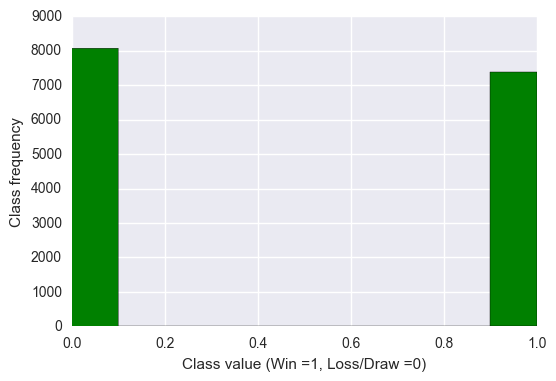

In [4]:
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

# Histogram of Home Win and No Home Win
plt.hist(match_players_11['Home_win'],color='g')
plt.xlabel('Class value (Win =1, Loss/Draw =0)')
plt.ylabel('Class frequency')
plt.show()

*From the figure above we see that both Home-win and No Home-win class frequencies are approximately balanced. This balanced frequency characteristic of the dataset needs to be preserved in the cross validation methodology as well. Maintaining this balance could be achieved through <font color='red'><b><u>stratification</b></u></font>. Therefore, <u>a stratified k-fold cross validation </u> is best suited for this study. Furthermore a 10-fold validation which provides the best balance between bias and variance is utilized in this study. *


## Generalization Verification Methodology

As mentioned before the objective of the exercise is to produce a deployable model capable of predicting real world match outcomes with a reasonable degree of accuracy. Therefore, understanding how the trained model generalizes to a larger unseen dataset is critical in its evaluation. To this effect, we have separated out (<b>‘vaulted’</b>) a portion of the dataset at the very beginning only to be used after the classifier is decided upon. In training, the validation measurements could become biased (lower than true error rates) since the model is trained and measured using the same data. To overcome this situation the vaulted dataset will be used to assess how well the fully-trained classifier generalizes thereby confirming the model’s usefulness in a deployment scenario. 

<img src="media/Vaulting.png" width="526" height="291" />


##    Cross Validation Criteria
<img src="media/Strat.PNG" width="362" height="268" />As briefly
mentioned above we will use the *10-fold stratified cross validation*
technique to validate the classifiers while its being trained. This
method will stratify the data and break it into 10 folds.
Stratification, as the image above shows, rearranges the data as to
ensure that it is a good representation of the original while maintaing its character.

As can be seen such for the soccer dataset at hand this will preserve
the observed Home-win and No Home-win frequency within the 10 folds.
Once the folds are divided, the technique will hold the first fold and
train using rest of the 9 folds and use the first fold to test the
model. This will be repeated by holding the second fold for testing with
the rest of the 9 and so on until each fold has been used as a test set.

<img src="media/10Fold.png" width="624" height="257" />

In the end 10 different models will get created. 10- fold validation is
a commonly used technique that balances bias and variance while being a
computationally inexpensive.[17]

In [58]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
# we want to predict the X and y data as follows:
if 'Home_win' in match_players_11:
    y_entire = match_players_11['Home_win'].values # get the labels we want to predict
    del match_players_11['Home_win'] # get rid of the class label to leave the predictors only
    X_entire = match_players_11.values # use all the predictors!

# We set aside 20% of the data for testing how well the final model generalizes on the unseen Data.    
X, X_GenTestData, y, y_GenTestData = train_test_split(X_entire, y_entire, test_size=0.20)

import numpy

y = y.ravel()
y_GenTestData = y_GenTestData.ravel()
print(y.ravel().shape)
#print(entire_dataset)
#print(np.matrix(y_entire).shape)  
#print(np.matrix(y_entire))
#print(np.matrix(y))
#print(np.matrix(X_entire).shape) 
#print(np.matrix(y_entire).shape) 
#print(np.matrix(y).shape)  
#print(np.matrix(X).shape) 
#print(np.matrix(y_GenTestData).shape)  
#print(np.matrix(X_GenTestData).shape) 

# create cross validation iterator
cv = StratifiedKFold(n_splits=10)
                         
print(cv)

# create variables we are more familiar with
yhat = np.zeros(y.shape) # we will fill this with predictions

# Exceptional Work : We are capturing time and accuracy to be plotted later
# To Capture Model Acc, False Postive, etc. with 10-Fold Cross-Validation
model_acc=dict()
model_fp=dict()
model_tp=dict()
model_cost=dict()
model_time=dict()

# To Capture Model Acc, False Postive, etc. on unseen real-world data
model_gen_acc=dict()
model_gen_fp=dict()
model_gen_tp=dict()
model_gen_cost=dict()
model_gen_time=dict()

(12368,)
StratifiedKFold(n_splits=10, random_state=None, shuffle=False)


### Cost Matrix For Model Evaluation

Evaluation of the result can be done using a variety of available rates and measurements. Accuracy provides a measure on how often the classifier is correct. Precision on the other hand measures how often a Home-win prediction is actually correct. Another common measurement, the F-score is a weighted measure of correct Home-win recall and precision. All in all, the most appropriate evaluation measurement must be chosen with the end-goal of the model in mind. The end goal of the model is to give better predictions to persons betting money on games in a way where the gamble pays off. In that context, a cost matrix with built in reward/penalty parameters is the better evaluation measurement for this case. 


Betting on a Home-win is a losing proposition when the model prediction turns out to be a False Positive. Therefore, the False positives, or predictions of Home wins which turn out to be erroneous need to be penalized at a much higher rate. Conversely, True Positives need to be rewarded. With the prospect of losing a bet being more detrimental than that of not winning, the magnitude of the penalty for False Negatives is greater than the reward given to True positives. This explains the values shown in the cost matrix below.
<BR>

In [6]:
import numpy as np

def find_expected_value(confusion, cost_benefit):
    # if you use a probability matrix instead, this next line will return the same matrix back
    probabilities = confusion.astype('float') / confusion.sum()
    return (probabilities * cost_benefit.astype('float')).sum()
cb = np.array([[45.0, 0], [-70, 0]])
print('Cost Matrix \n', cb)


Cost Matrix 
 [[ 45.   0.]
 [-70.   0.]]


## Model Building - Classification

### A.) KNN Classification

In [7]:
%%time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn import metrics as mt

# Standardize the predictors as KNN is sensitive to range that predictors take.
scl = StandardScaler()
for i in range(1,10):
# get a handle to the classifier object, which defines the type
 clf = KNeighborsClassifier(n_neighbors=i)

# now iterate through and get predictions, saved to the correct row in yhat
 for train, test in cv.split(scl.fit_transform(X),y):
  clf.fit(X[train],y[train])
  yhat[test] = clf.predict(X[test])
 total_accuracy = mt.accuracy_score(y, yhat)
 #print(y[:10],yhat[:10])
 print ('KNN accuracy when using ', i, "Neighbors: ", total_accuracy)

KNN accuracy when using  1 Neighbors:  0.920358990944
KNN accuracy when using  2 Neighbors:  0.909686287193
KNN accuracy when using  3 Neighbors:  0.917529107374
KNN accuracy when using  4 Neighbors:  0.889715394567
KNN accuracy when using  5 Neighbors:  0.875727684347
KNN accuracy when using  6 Neighbors:  0.851471539457
KNN accuracy when using  7 Neighbors:  0.829883570505
KNN accuracy when using  8 Neighbors:  0.807891332471
KNN accuracy when using  9 Neighbors:  0.783473479948
CPU times: user 5min 27s, sys: 1.97 s, total: 5min 29s
Wall time: 5min 41s


*1 neighbor gives the highest accuracy of 0.92 for KNN classification. We chose 3 neighbors as picking just 1 or 2 neighbors might possibly overfit the model, resulting in generalization difficulties later on. <BR>*

### KNN Classification with PCA components and 3 Neighbors

In [8]:
%%time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA 
from sklearn.pipeline import Pipeline

# setup pipeline to take PCA, then fit a KNN classifier using different number of PCA components
for pca_components in [1,2,5,10,30,50,80,100]:
 clf_pipe = Pipeline(
 [('PCA',PCA(n_components=pca_components,svd_solver='randomized')),
 ('CLF',KNeighborsClassifier(n_neighbors=3))])

# now iterate through and get predictions, saved to the correct row in yhat
 for train, test in cv.split(scl.fit_transform(X),y):
  clf_pipe.fit(X[train],y[train])
  yhat[test] = clf_pipe.predict(X[test])

 total_accuracy = mt.accuracy_score(y, yhat)
 print ('KNN + PCA, with ',pca_components,'pca_components, pipeline accuracy', total_accuracy)

KNN + PCA, with  1 pca_components, pipeline accuracy 0.55376778784
KNN + PCA, with  2 pca_components, pipeline accuracy 0.588777490298
KNN + PCA, with  5 pca_components, pipeline accuracy 0.837079560155
KNN + PCA, with  10 pca_components, pipeline accuracy 0.871927554981
KNN + PCA, with  30 pca_components, pipeline accuracy 0.879932082794
KNN + PCA, with  50 pca_components, pipeline accuracy 0.901520051746
KNN + PCA, with  80 pca_components, pipeline accuracy 0.914214100906
KNN + PCA, with  100 pca_components, pipeline accuracy 0.917367399741
CPU times: user 1min 42s, sys: 3.68 s, total: 1min 46s
Wall time: 1min 33s


*No substantial improvement seen in the KNN model accuracy with 100 PCA components. PCA doesn’t seem to provide much of an advantage for KNN classifiers.<BR>*

### Final KNN Model with 3 Neighbors 

In [9]:
%%time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA 
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import time
scl = StandardScaler()

start_time=time.time()
clf_knn = KNeighborsClassifier(n_neighbors=3)

for train, test in cv.split(scl.fit_transform(X),y):
 clf_knn.fit(X[train],y[train])
 yhat[test] = clf_knn.predict(X[test])

end_time=time.time()

# Prediction on Unseen Real Data
yhat_GenTestData=clf_knn.predict(X_GenTestData)

CPU times: user 52 s, sys: 663 ms, total: 52.7 s
Wall time: 56.9 s


### Confusion , Cost Matrix and Cost for the KNN Model with 10-Fold Stratified Cross-Validation

In [10]:
from sklearn import metrics as mt
acc = mt.accuracy_score(y,yhat)
conf = mt.confusion_matrix(y,yhat)

print("accuracy of KNN Model", acc )
print("confusion matrix\n",conf)
print('Cost Matrix \n', cb)
print ('Cost of the KNN model =',find_expected_value(conf, cb))

# To Capture Model Acc, False Postive, etc. with 10-Fold Cross-Validation
model_acc['KNN']=acc*100
model_fp['KNN']=conf[1][0]
model_tp['KNN']=conf[0][0]
model_cost['KNN']=find_expected_value(conf, cb)
model_time['KNN']=(end_time - start_time)
#print(model_time)


accuracy of KNN Model 0.917529107374
confusion matrix
 [[5936  524]
 [ 496 5412]]
Cost Matrix 
 [[ 45.   0.]
 [-70.   0.]]
Cost of the KNN model = 18.7904269082


### Confusion , Cost Matrix and Cost for KNN Model on Unseen Real Data

In [11]:
from sklearn import metrics as mt
acc = mt.accuracy_score(y_GenTestData,yhat_GenTestData)
conf = mt.confusion_matrix(y_GenTestData,yhat_GenTestData)

print("accuracy of KNN Model on Unseen Real Data", acc )
print("confusion matrix on Unseen Real Data\n",conf)
print('Cost Matrix on Unseen Real Data\n', cb)
print ('Cost of the KNN model on Unseen Real Data =',find_expected_value(conf, cb))

# To Capture Model Acc, False Postive, etc. on unseen real-world data
model_gen_acc['KNN']=acc*100
model_gen_fp['KNN']=conf[1][0]
model_gen_tp['KNN']=conf[0][0]
model_gen_cost['KNN']=find_expected_value(conf, cb)
model_gen_time['KNN']=(end_time - start_time)

accuracy of KNN Model on Unseen Real Data 0.922056921087
confusion matrix on Unseen Real Data
 [[1501  113]
 [ 128 1350]]
Cost Matrix on Unseen Real Data
 [[ 45.   0.]
 [-70.   0.]]
Cost of the KNN model on Unseen Real Data = 18.9472833118


*When looking at the overall results from the KNN classification we can see that the model performed fairly well. The confusion matrix shows that the diagonal, predictions matching actuals, is heavily weighted. The true cost (cost when run against vaulted/unseen data) of the model is 18.9 which leads one to believe that the model will produce a payoff in a sports betting scenario. Although KNN in general is considered as being computationally expensive the cost measurements in this study were modest.<BR>*


### B.) Random Forest

In [12]:
%%time
from sklearn.ensemble import RandomForestClassifier
depths = [1,10, 20, 30, 40, 50]
estimators = [50, 75, 100, 125,150]

for estimator in estimators:
 for depth in depths:
  clf_rf = RandomForestClassifier(max_depth=depth, n_estimators=estimator, n_jobs=-1, oob_score=True)
  for train, test in cv.split(X,y):
   clf_rf.fit(X[train],y[train])
   yhat[test] = clf_rf.predict(X[test])
  total_accuracy = mt.accuracy_score(y, yhat)
  print ('With Estimators=',estimator,'And Depths',depth,'Accuracy', total_accuracy,'Generalization Score',clf_rf.oob_score_)


With Estimators= 50 And Depths 1 Accuracy 0.63834087969 Generalization Score 0.635465325189
With Estimators= 50 And Depths 10 Accuracy 0.880417205692 Generalization Score 0.874775422206
With Estimators= 50 And Depths 20 Accuracy 0.968143596378 Generalization Score 0.967391304348
With Estimators= 50 And Depths 30 Accuracy 0.968224450194 Generalization Score 0.967930291053
With Estimators= 50 And Depths 40 Accuracy 0.96830530401 Generalization Score 0.96622349982
With Estimators= 50 And Depths 50 Accuracy 0.968790426908 Generalization Score 0.966313330938
With Estimators= 75 And Depths 1 Accuracy 0.636642949547 Generalization Score 0.631602587136
With Estimators= 75 And Depths 10 Accuracy 0.882519404916 Generalization Score 0.877290693496
With Estimators= 75 And Depths 20 Accuracy 0.967981888745 Generalization Score 0.966852317643
With Estimators= 75 And Depths 30 Accuracy 0.968143596378 Generalization Score 0.9676607977
With Estimators= 75 And Depths 40 Accuracy 0.96919469599 Generaliza

*Random Forest with a Depth of 30 with 150 Estimators gives the highest accuracy for our data.<BR>*

### Final Random Forest Model with Depth=30 and Estimator=150

In [13]:
%%time
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics as mt
import time

start_time=time.time()
clf_rf = RandomForestClassifier(max_depth=30, n_estimators=150, n_jobs=-1, oob_score=True)

# Now iterate through and get predictions, saved to the correct row in yhat
for train, test in cv.split(X,y):
    clf_rf.fit(X[train],y[train])
    yhat[test] = clf_rf.predict(X[test])
    
end_time=time.time()
# Prediction on Unseen Real Data
yhat_GenTestData=clf_rf.predict(X_GenTestData)

total_accuracy = mt.accuracy_score(y, yhat)
print ('Accuracy', total_accuracy)

Accuracy 0.969113842173
CPU times: user 1min 19s, sys: 537 ms, total: 1min 19s
Wall time: 26.4 s


### Confusion , Cost Matrix and Cost for Random Forest Model with 10-Fold Stratified Cross-Validation

In [14]:
import numpy as np

acc = mt.accuracy_score(y,yhat)
conf = mt.confusion_matrix(y,yhat)

print("accuracy of Random Forest Model", acc )
print("confusion matrix of Random Forest Model\n",conf)
print('Cost Matrix \n', cb)
print ('Cost of the Random Forest model =',find_expected_value(conf, cb))

model_acc['Random-Forest']=acc*100
model_fp['Random-Forest']=conf[1][0]
model_tp['Random-Forest']=conf[0][0]
model_cost['Random-Forest']=find_expected_value(conf, cb)
model_time['Random-Forest']=(end_time - start_time)
#print(model_time)

accuracy of Random Forest Model 0.969113842173
confusion matrix of Random Forest Model
 [[6290  170]
 [ 212 5696]]
Cost Matrix 
 [[ 45.   0.]
 [-70.   0.]]
Cost of the Random Forest model = 21.6858020699


### Confusion , Cost Matrix and Cost for Random Model on Unseen Real Data

In [15]:
from sklearn import metrics as mt
acc = mt.accuracy_score(y_GenTestData,yhat_GenTestData)
conf = mt.confusion_matrix(y_GenTestData,yhat_GenTestData)

print("accuracy of Model on Unseen Real Data", acc )
print("confusion matrix on Unseen Real Data\n",conf)
print('Cost Matrix on Unseen Real Data\n', cb)
print ('Cost of the model on Unseen Real Data =',find_expected_value(conf, cb))

# To Capture Model Acc, False Postive, etc. on unseen real-world data
model_gen_acc['Random-Forest']=acc*100
model_gen_fp['Random-Forest']=conf[1][0]
model_gen_tp['Random-Forest']=conf[0][0]
model_gen_cost['Random-Forest']=find_expected_value(conf, cb)
model_gen_time['Random-Forest']=(end_time - start_time)

accuracy of Model on Unseen Real Data 0.974450194049
confusion matrix on Unseen Real Data
 [[1587   27]
 [  52 1426]]
Cost Matrix on Unseen Real Data
 [[ 45.   0.]
 [-70.   0.]]
Cost of the model on Unseen Real Data = 21.919469599


### Random Forest: Feature Importance

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=30, max_features='auto', max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=150, n_jobs=-1, oob_score=True, random_state=None,
            verbose=0, warm_start=False)


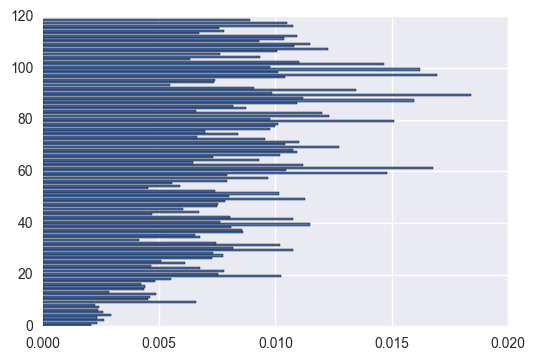

Generalization score estimate from training data 0.969367588933
Top 10 Features sorted by their score:
[(0.0184, 'avg_player_rating_8'), (0.017000000000000001, 'avg_ball_control_8'), (0.016799999999999999, 'avg_reactions_5'), (0.016199999999999999, 'avg_player_rating_9'), (0.015900000000000001, 'avg_ball_control_7'), (0.015100000000000001, 'avg_player_rating_7'), (0.014800000000000001, 'avg_player_rating_5'), (0.0147, 'avg_reactions_9'), (0.0135, 'avg_reactions_8'), (0.012699999999999999, 'avg_player_rating_6')]
CPU times: user 598 ms, sys: 152 ms, total: 750 ms
Wall time: 920 ms


In [16]:
%%time
# Now lets get access to the different properties of our RF

print (clf_rf)
feature_names = match_players_11.columns.tolist()
#print(feature_names)
plt.barh(range(len(clf_rf.feature_importances_)), clf_rf.feature_importances_)
plt.show()
print ('Generalization score estimate from training data', clf_rf.oob_score_)

print("Top 10 Features sorted by their score:")
print(sorted(zip(map(lambda x: round(x, 4), clf_rf.feature_importances_), feature_names),reverse=True)[:10])


*Features such as avg_player_rating_9, avg_player_rating_8, avg_ball_control_8, avg_reactions_5 etc. were selected as the most important features in Random Forest.*

The Random Forest classification was used with hyperparameter of Depth of the tree being at 1, 10, 30, 40 and 50 different levels, and estimators at 50, 75, 100, 125 and 150. The best accuracy was observed at Tree depth of 30 with 150 estimators. The computational cost was marginally better than KNN at 26 seconds. But the true cost (cost when run against vaulted/unseen data) was 21.9 which was at 18.9 using KNN. Here we see Random forest having a slight edge over KNN. 

More over Random forest identified center forward’s (or Player 9) average rating being the most important. This is well in-line with the real world as players 6 – 9 are typically mid fielders with player 9 being the reserved spot for the most creative and highest goal scoring player in the squad. [18]. It was also showing that average reaction of the typically defensive center-half-back (Player 5) was the second most favorable trait which also aligns with common soccer know-how. It was interesting to observe that Team tactics did not factor-in as much as the skillset of mid-fielders. Overall the model seemed to have worked quite well.<BR>


### C.) AdaBoostClassifier 

In [17]:
%%time

from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

depths = [1,10, 20]
estimators = [50, 75, 100]

for estimator in estimators:
 for depth in depths:
  dt_stump = DecisionTreeClassifier(max_depth=depth, criterion='gini',
            max_features=None, min_samples_leaf=1, min_samples_split=2, random_state=None,
            splitter='best')

  clf_adaboost = AdaBoostClassifier(base_estimator=dt_stump, n_estimators=estimator)

# now iterate through and get predictions, saved to the correct row in yhat
  for train, test in cv.split(X,y):
   clf_adaboost.fit(X[train],y[train])
   yhat[test] = clf_adaboost.predict(X[test])
    
  total_accuracy = mt.accuracy_score(y, yhat)
  print ('With Estimators=',estimator,'And Depths',depth,'Accuracy', total_accuracy)

With Estimators= 50 And Depths 1 Accuracy 0.657260672704
With Estimators= 50 And Depths 10 Accuracy 0.96175614489
With Estimators= 50 And Depths 20 Accuracy 0.968143596378
With Estimators= 75 And Depths 1 Accuracy 0.667690815006
With Estimators= 75 And Depths 10 Accuracy 0.964343467012
With Estimators= 75 And Depths 20 Accuracy 0.967577619664
With Estimators= 100 And Depths 1 Accuracy 0.673916558862
With Estimators= 100 And Depths 10 Accuracy 0.964909443726
With Estimators= 100 And Depths 20 Accuracy 0.968062742561
CPU times: user 42min 25s, sys: 5.38 s, total: 42min 31s
Wall time: 42min 49s


*AdaBoost with Estimators= 100 And Depths 20 gave Accuracy 0.968062742561*

### AdaBoostClassifier with PCA

In [18]:
%%time
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier


dt_stump = DecisionTreeClassifier(max_depth=20, criterion='gini',
            max_features=None, min_samples_leaf=1, min_samples_split=2, random_state=None,
            splitter='best')
for pca_components in [1,10,50,100]:
 clf_pipe = Pipeline(
    [('PCA',PCA(n_components=pca_components,svd_solver='randomized')),
     ('CLF',AdaBoostClassifier(base_estimator=dt_stump, n_estimators=100))])
# now iterate through and get predictions, saved to the correct row in yhat
 for train, test in cv.split(X,y):
    clf_pipe.fit(X[train],y[train])
    yhat[test] = clf_pipe.predict(X[test])
    
 total_accuracy = mt.accuracy_score(y, yhat)
 print ('AdaBoost + PCA, with ',pca_components,'pca_components, pipeline accuracy', total_accuracy)

AdaBoost + PCA, with  1 pca_components, pipeline accuracy 0.535009702458
AdaBoost + PCA, with  10 pca_components, pipeline accuracy 0.831662354463
AdaBoost + PCA, with  50 pca_components, pipeline accuracy 0.816461836999
AdaBoost + PCA, with  100 pca_components, pipeline accuracy 0.900388098318
CPU times: user 1h 8min 1s, sys: 54.4 s, total: 1h 8min 56s
Wall time: 1h 31min 12s


### Final AdaBoostClassifier Model 

In [19]:
%%time
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
import time

start_time=time.time()

dt_stump = DecisionTreeClassifier(max_depth=20, criterion='gini',
            max_features=None, min_samples_leaf=1, min_samples_split=2, random_state=None,
            splitter='best')
clf_adaboost = AdaBoostClassifier(base_estimator=dt_stump, n_estimators=10)

for train, test in cv.split(X,y):
    clf_adaboost.fit(X[train],y[train])
    yhat[test] = clf_adaboost.predict(X[test])

end_time=time.time()
# Prediction on Unseen Real Data
yhat_GenTestData=clf_adaboost.predict(X_GenTestData)


CPU times: user 1min 38s, sys: 1.89 s, total: 1min 40s
Wall time: 2min 35s


### Confusion , Cost Matrix and Cost for AdaBoost Model with 10-Fold Stratified Cross-Validation

In [20]:
import numpy as np

acc = mt.accuracy_score(y,yhat)
conf = mt.confusion_matrix(y,yhat)

print("accuracy of Ada Boost Classifier Model", acc )
print("confusion matrix of Ada Boost Classifier Model\n",conf)
print('Cost Matrix \n', cb)
print ('Cost of the Ada Boost Classifier model =',find_expected_value(conf, cb))

model_acc['AdaBoost']=acc*100
model_fp['AdaBoost']=conf[1][0]
model_tp['AdaBoost']=conf[0][0]
model_cost['AdaBoost']=find_expected_value(conf, cb)
model_time['AdaBoost']=(end_time - start_time)
print(model_time)


accuracy of Ada Boost Classifier Model 0.965313712807
confusion matrix of Ada Boost Classifier Model
 [[6258  202]
 [ 227 5681]]
Cost Matrix 
 [[ 45.   0.]
 [-70.   0.]]
Cost of the Ada Boost Classifier model = 21.4844760673
{'AdaBoost': 155.02728509902954, 'Random-Forest': 26.32544708251953, 'KNN': 49.78249001502991}


### Confusion , Cost Matrix and Cost for AdaBoost Model on Unseen Real Data

In [21]:
from sklearn import metrics as mt
acc = mt.accuracy_score(y_GenTestData,yhat_GenTestData)
conf = mt.confusion_matrix(y_GenTestData,yhat_GenTestData)

print("accuracy of Model on Unseen Real Data", acc )
print("confusion matrix on Unseen Real Data\n",conf)
print('Cost Matrix on Unseen Real Data\n', cb)
print ('Cost of the KNN model on Unseen Real Data =',find_expected_value(conf, cb))

# To Capture Model Acc, False Postive, etc. on unseen real-world data
model_gen_acc['AdaBoost']=acc*100
model_gen_fp['AdaBoost']=conf[1][0]
model_gen_tp['AdaBoost']=conf[0][0]
model_gen_cost['AdaBoost']=find_expected_value(conf, cb)
model_gen_time['AdaBoost']=(end_time - start_time)

accuracy of Model on Unseen Real Data 0.962807244502
confusion matrix on Unseen Real Data
 [[1564   50]
 [  65 1413]]
Cost Matrix on Unseen Real Data
 [[ 45.   0.]
 [-70.   0.]]
Cost of the KNN model on Unseen Real Data = 21.2904269082


Adaptive boosting which iteratively rebalancers based on misclassifications is put through the paces next. The decision tree is used here as the base classifier with depths of 1, 10, 20 and estimators at 50, 75, and 100. The initial results show that a depth of 20 with estimators at 100 produces the best accuracy for the model. Comparatively the training cost is quite high for this model at 155 seconds. We then ran AdaBoost with PCA and saw the accuracy taking a dramatic downturn with training time taking even longer. One of the reasons for the downturn could be overfitting the training data. 

Once finding optimal hyper parameters, we reverted back to the non-PCA AdaBoost classifier which produced a competitive 155 second performance. Confusion matrix also looked stronger with a lower all-important False Positive value. With the low False positives the Cost for this method was measured at 21.29 when tested against vaulted data. <BR>


### D.) Gaussian NB

In [22]:
%%time
# from sklearn.svm import SVC
# from sklearn.linear_model import LogisticRegression
# from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
import time

start_time=time.time()

clf_gnb = GaussianNB()

# now iterate through and get predictions, saved to the correct row in yhat
for train, test in cv.split(X,y):
    clf_gnb.fit(X[train],y[train])
    yhat[test] = clf_gnb.predict(X[test])

end_time=time.time()
total_accuracy = mt.accuracy_score(y, yhat)
print ('Accuracy', total_accuracy)

Accuracy 0.633247089263
CPU times: user 457 ms, sys: 174 ms, total: 630 ms
Wall time: 1.09 s


#### Gaussian NB with PCA

In [23]:
%%time
from sklearn.naive_bayes import GaussianNB

# setup pipeline to take PCA, then fit a different classifier
for pca_components in [1,2,5,10,30,50,80,100]:
 clf_pipe = Pipeline(
    [('PCA',PCA(n_components=pca_components,svd_solver='randomized')),
     ('CLF',GaussianNB())])

# now iterate through and get predictions, saved to the correct row in yhat
 for train, test in cv.split(X,y):
  clf_pipe.fit(X[train],y[train])
  yhat[test] = clf_pipe.predict(X[test])

 total_accuracy = mt.accuracy_score(y, yhat)
 print ('Gaussian NB + PCA, with ',pca_components,'pca_components, pipeline accuracy', total_accuracy)


Gaussian NB + PCA, with  1 pca_components, pipeline accuracy 0.627344760673
Gaussian NB + PCA, with  2 pca_components, pipeline accuracy 0.627102199224
Gaussian NB + PCA, with  5 pca_components, pipeline accuracy 0.624514877102
Gaussian NB + PCA, with  10 pca_components, pipeline accuracy 0.627910737387
Gaussian NB + PCA, with  30 pca_components, pipeline accuracy 0.630498059508
Gaussian NB + PCA, with  50 pca_components, pipeline accuracy 0.631872574386
Gaussian NB + PCA, with  80 pca_components, pipeline accuracy 0.631791720569
Gaussian NB + PCA, with  100 pca_components, pipeline accuracy 0.62936610608
CPU times: user 27.6 s, sys: 3.62 s, total: 31.2 s
Wall time: 37.8 s


### Final Gaussian NB Model 

In [24]:
%%time
from sklearn.naive_bayes import GaussianNB
import time

start_time=time.time()
clf_pipe = Pipeline(
    [('PCA',PCA(n_components=1,svd_solver='randomized')),
     ('CLF',GaussianNB())])
for train, test in cv.split(X,y):
 clf_pipe.fit(X[train],y[train])
 yhat[test] = clf_pipe.predict(X[test])
    
# Prediction on Unseen Real Data
yhat_GenTestData=clf_pipe.predict(X_GenTestData)    
end_time=time.time()

CPU times: user 1.6 s, sys: 190 ms, total: 1.79 s
Wall time: 4.87 s


### Confusion , Cost Matrix and Cost for Gaussian NB Model with 10-Fold Stratified Cross-Validation

In [25]:
import numpy as np

acc = mt.accuracy_score(y,yhat)
conf = mt.confusion_matrix(y,yhat)

print("accuracy of Gaussian NB Classifier Model", acc )
print("confusion matrix of Gaussian NB Classifier Model\n",conf)
print('Cost Matrix \n', cb)
print ('Cost of the Gaussian NB Classifier model =',find_expected_value(conf, cb))

model_acc['GaussianNB']=acc*100
model_fp['GaussianNB']=conf[1][0]
model_tp['GaussianNB']=conf[0][0]
model_cost['GaussianNB']=find_expected_value(conf, cb)
model_time['GaussianNB']=(end_time - start_time)
print(model_time)

accuracy of Gaussian NB Classifier Model 0.627344760673
confusion matrix of Gaussian NB Classifier Model
 [[4747 1713]
 [2896 3012]]
Cost Matrix 
 [[ 45.   0.]
 [-70.   0.]]
Cost of the Gaussian NB Classifier model = 0.88090232859
{'AdaBoost': 155.02728509902954, 'Random-Forest': 26.32544708251953, 'GaussianNB': 4.868757009506226, 'KNN': 49.78249001502991}


### Confusion , Cost Matrix and Cost for Gaussian NB Model on Unseen Real Data

In [26]:
from sklearn import metrics as mt
acc = mt.accuracy_score(y_GenTestData,yhat_GenTestData)
conf = mt.confusion_matrix(y_GenTestData,yhat_GenTestData)

print("accuracy of Model on Unseen Real Data", acc )
print("confusion matrix on Unseen Real Data\n",conf)
print('Cost Matrix on Unseen Real Data\n', cb)
print ('Cost of the KNN model on Unseen Real Data =',find_expected_value(conf, cb))

# To Capture Model Acc, False Postive, etc. on unseen real-world data
model_gen_acc['GaussianNB']=acc*100
model_gen_fp['GaussianNB']=conf[1][0]
model_gen_tp['GaussianNB']=conf[0][0]
model_gen_cost['GaussianNB']=find_expected_value(conf, cb)
model_gen_time['GaussianNB']=(end_time - start_time)

accuracy of Model on Unseen Real Data 0.613518758085
confusion matrix on Unseen Real Data
 [[1145  469]
 [ 726  752]]
Cost Matrix on Unseen Real Data
 [[ 45.   0.]
 [-70.   0.]]
Cost of the KNN model on Unseen Real Data = 0.228007761966


### Statistical Comparison Between 1-PCA and 50-PCA Gaussian NB

In [27]:
from sklearn.decomposition import PCA 
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics as mt

clf1 = Pipeline(
    [('PCA',PCA(n_components=1,svd_solver='randomized')),
     ('CLF',GaussianNB())]
)
clf2 = Pipeline(
    [('PCA',PCA(n_components=50,svd_solver='randomized')),
     ('CLF',GaussianNB())]
)


from sklearn.model_selection import cross_val_score
# is clf1 better or worse than clf2?
cv=StratifiedKFold(n_splits=10)
acc1 = cross_val_score(clf1, X, y=y, cv=cv)
acc2 = cross_val_score(clf2, X, y=y, cv=cv)

#=================================

t = 2.26 / np.sqrt(10)

e = (1-acc1)-(1-acc2)
# std1 = np.std(acc1)
# std2 = np.std(acc2)
stdtot = np.std(e)

dbar = np.mean(e)
print ('Range of:', dbar-t*stdtot,dbar+t*stdtot )
print (np.mean(acc1), np.mean(acc2))



Range of: -0.00181482184223 0.00957631810237
0.62734529724 0.63122604537


*The range does contain Zero. Therefore, Gaussian model with 1 PCA is not statistically better than model with 50 PCA*

The initial observation from Gaussian Naïve Bayes was that training took a remarkably low time at 5 seconds but the accuracy of the model was a paltry 0.61. Then we performed Gaussian Naïve Bayes with PCA and observed that the accuracy did not improve much even with an array of wide ranging component counts. The computational time increased when PCA was used. 

Taking the non-PCA model as the best candidate we ran the model again and examined the confusion matrix. The diagonal was only marginally better and the Cost, the key measure that we are interested in maximizing, was very low. The non-PCA Gaussian NB model did not fare well with the vaulted data as well. The true (vaulted) Cost was measured at 0.228.<BR>


### Comparison between Ensemble Classifiers such as Decision Stump, Ada Boost , Random Forest, Extra Tree and Decision Tree Classifiers

In [28]:
%%time
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import precision_score

num_estimators = 150
# lets train some trees
clf_array = [
    ('DecisionStump',              DecisionTreeClassifier(max_depth=1, min_samples_leaf=1)),
    ('Tree',               DecisionTreeClassifier()),
    ('Random Trees',       RandomForestClassifier(max_depth=30, n_estimators=num_estimators)),
    ('Extra Random Trees', ExtraTreesClassifier(n_estimators=num_estimators,min_samples_split=2)),
    ('Gaussian Naive Bayes',GaussianNB()),
    ('KNN',KNeighborsClassifier(n_neighbors=3))
    ]

model_accuracy=[]
for clf in clf_array:
    acc = cross_val_score(clf[1],X,y,cv=10)
    model_accuracy.append((clf[0],acc.mean))
    print(clf[0],"Accuracy: %0.3f (+/- %0.3f)" % (acc.mean(), acc.std() * 2))
    

DecisionStump Accuracy: 0.611 (+/- 0.024)
Tree Accuracy: 0.966 (+/- 0.011)
Random Trees Accuracy: 0.969 (+/- 0.009)
Extra Random Trees Accuracy: 0.969 (+/- 0.008)
Gaussian Naive Bayes Accuracy: 0.633 (+/- 0.036)
KNN Accuracy: 0.918 (+/- 0.012)
CPU times: user 2min 28s, sys: 2.81 s, total: 2min 31s
Wall time: 3min 30s


In [29]:
#print(model_accuracy)
#np_model_accuracy=np.array(model_accuracy)
#print(np_model_accuracy[:][:])

### Model's Cost on 10 Fold-Cross Validation

In [30]:
print(model_cost)

{'AdaBoost': 21.484476067270375, 'Random-Forest': 21.685802069857697, 'GaussianNB': 0.88090232858991158, 'KNN': 18.790426908150064}


## Model Comparision on Cross Validation- Exceptional Item (Rubric)

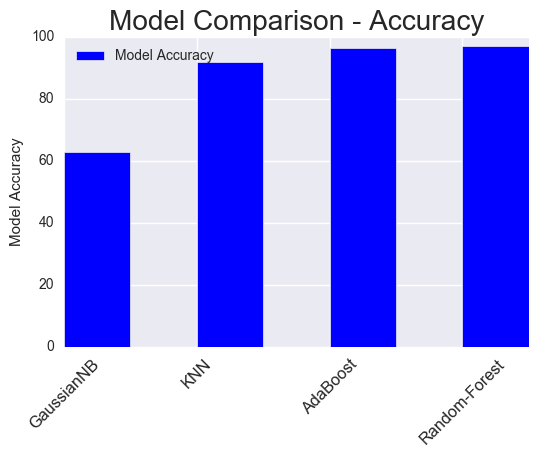

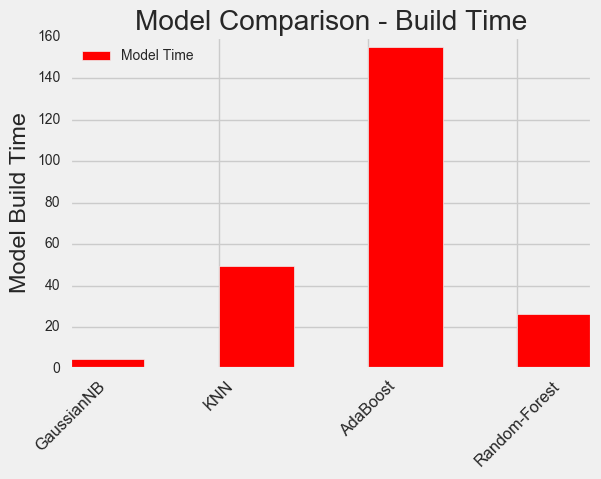

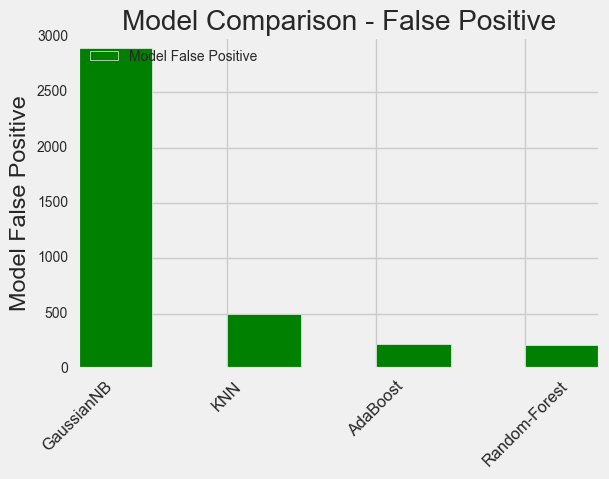

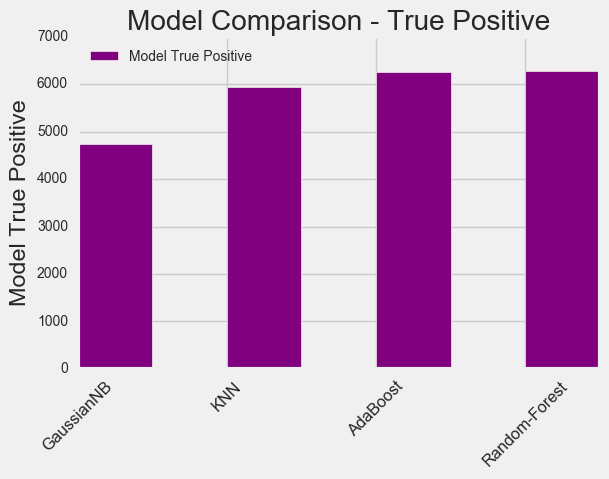

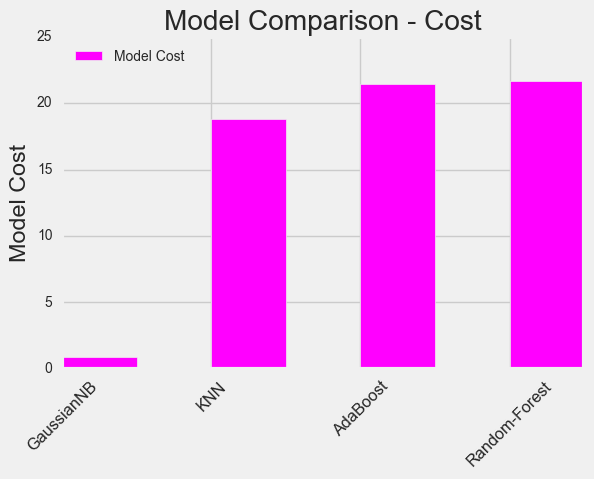

In [31]:
import matplotlib.pyplot as plt
plt.figure()
plt.hold(True)
l = sorted(model_acc, key= model_acc.get)

y1 = []
y2 = []
y3 = []
y4 = []
y5 = []

for model in l:
    y1.append(model_acc[model])
    y2.append(model_time[model])
    y3.append(model_fp[model])
    y4.append(model_tp[model])
    y5.append(model_cost[model])
  
y_pos = np.arange(len(y1))

plt.style.use('fivethirtyeight')
plt.bar(y_pos,y1, width = 0.5, color = 'blue')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model Accuracy')
plt.title('Model Comparison - Accuracy')
plt.legend(['Model Accuracy'], loc = 2)
plt.show()

plt.figure()
plt.hold(True)
plt.bar(y_pos,y2, width = 0.5, color = 'red')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model Build Time')
plt.title('Model Comparison - Build Time')
plt.legend(['Model Time'], loc = 2)
plt.show()

plt.figure()
plt.hold(True)
plt.bar(y_pos,y3, width = 0.5, color = 'green')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model False Positive')
plt.title('Model Comparison - False Positive')
plt.legend(['Model False Positive'], loc = 2)
plt.show()

plt.figure()
plt.hold(True)
plt.bar(y_pos,y4, width = 0.5, color = 'purple')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model True Positive')
plt.title('Model Comparison - True Positive')
plt.legend(['Model True Positive'], loc = 2)
plt.show()

plt.figure()
plt.hold(True)
plt.bar(y_pos,y5, width = 0.5, color = 'magenta')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model Cost')
plt.title('Model Comparison - Cost')
plt.legend(['Model Cost'], loc = 2)
plt.show()


## Side by Side Comparision of Characteristics of the Classfiers

<img src="media/Cls.png" width="850" height="225" />



| <img src="media/download4.png" width="430" height="278" /> | The ever-important cost measurement shows that AdaBoost and Random-Forest gives the best results, with higher Cost translating to a better chance of a payoff in a sports betting situation.                                     |
|---------------------------------------------------------|---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| <img src="media/download0.png" width="350" height="278" /> | Accuracy seems to be very competitive between AdaBoost and Random Forest. While KNN is competitive But, Gaussian NB drops off significantly.                                                                                            |
| <img src="media/download1.png" width="350" height="278" /> | Build time gives Gaussian NB a clear advantage with the more accurate models taking more time to train. Random Forest fared much better than AdaBoost with training taking less than half of what it took for AdaBoost.                     |
| <img src="media/download2.png" width="350" height="278" /> | False positive rate, the key measurement that a person betting would be concerned about, is highest with Gaussian NB and lowest with both AdaBoost and Random forest. AdaBoost and Random forest measurements are almost a dead heat. |
| <img src="media/download3.png" width="350" height="278" /> | True positive rates, where there is a payoff in a betting scenario, is as expected, fared best by AdaBoost and Random forest with both models showing remarkably close measurements.                                                    |

*All-in-all AdaBoost and Random-Forest both seem to model the outcome
best with the only significant differentiator between the two being the
training time taken. <b>As such Random Forest is the Classifier
that generalizes to this problem the best<span>.*</b><BR>


### Model's Cost on Unseen Data

In [32]:
print(model_gen_cost)

{'AdaBoost': 21.29042690815006, 'Random-Forest': 21.919469598965069, 'GaussianNB': 0.22800776196636363, 'KNN': 18.947283311772313}


## Model Comparision on Unseen Data- Exceptional Item (Rubric)

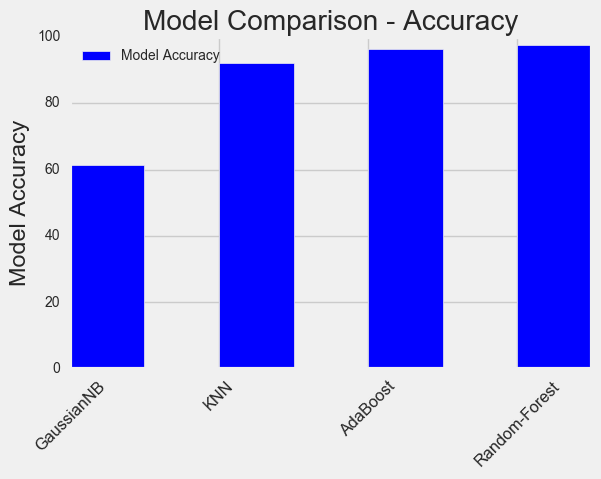

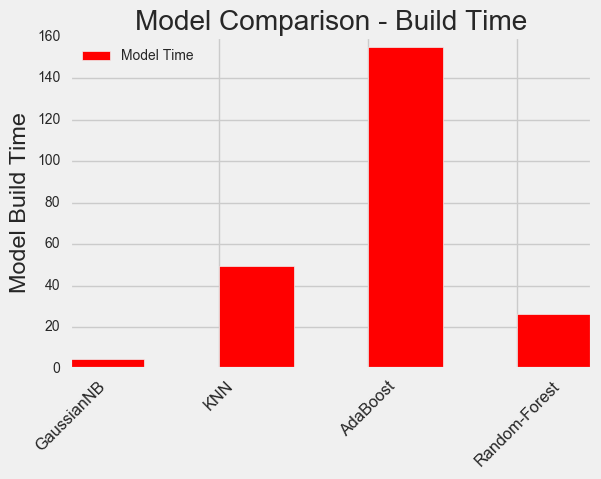

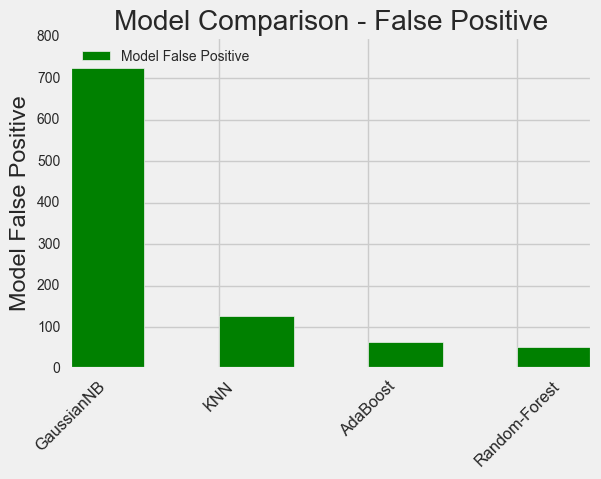

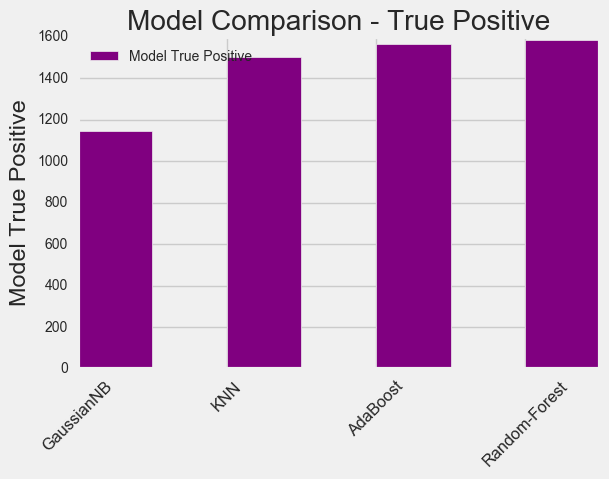

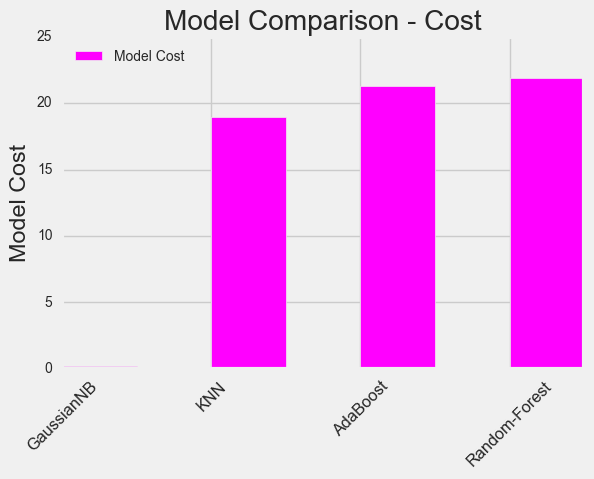

In [33]:
import matplotlib.pyplot as plt
plt.figure()
plt.hold(True)
l = sorted(model_gen_acc, key= model_acc.get)

y1 = []
y2 = []
y3 = []
y4 = []
y5 = []

for model in l:
    y1.append(model_gen_acc[model])
    y2.append(model_gen_time[model])
    y3.append(model_gen_fp[model])
    y4.append(model_gen_tp[model])
    y5.append(model_gen_cost[model])
  
y_pos = np.arange(len(y1))

plt.style.use('fivethirtyeight')
plt.bar(y_pos,y1, width = 0.5, color = 'blue')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model Accuracy')
plt.title('Model Comparison - Accuracy')
plt.legend(['Model Accuracy'], loc = 2)
plt.show()

plt.figure()
plt.hold(True)
plt.bar(y_pos,y2, width = 0.5, color = 'red')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model Build Time')
plt.title('Model Comparison - Build Time')
plt.legend(['Model Time'], loc = 2)
plt.show()

plt.figure()
plt.hold(True)
plt.bar(y_pos,y3, width = 0.5, color = 'green')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model False Positive')
plt.title('Model Comparison - False Positive')
plt.legend(['Model False Positive'], loc = 2)
plt.show()

plt.figure()
plt.hold(True)
plt.bar(y_pos,y4, width = 0.5, color = 'purple')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model True Positive')
plt.title('Model Comparison - True Positive')
plt.legend(['Model True Positive'], loc = 2)
plt.show()

plt.figure()
plt.hold(True)
plt.bar(y_pos,y5, width = 0.5, color = 'magenta')
plt.xticks(y_pos , l, size='small',rotation= 45)
plt.ylabel('Model Cost')
plt.title('Model Comparison - Cost')
plt.legend(['Model Cost'], loc = 2)
plt.show()


## Grid Search for finding optimal values of model parameters - Exceptional Item (Rubric)

In [34]:
%%time
from sklearn.grid_search import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
# Build a classification task using 3 informative features

rfc = RandomForestClassifier(n_jobs=-1,max_features= 'sqrt' ,n_estimators=125, oob_score = True) 

param_grid = { 
    'n_estimators': [100,125,150],
    'max_features': ['auto', 'sqrt', 'log2']
}

CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 10)
CV_rfc.fit(X, y)
print(CV_rfc.best_params_)

//anaconda/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
//anaconda/lib/python3.5/site-packages/sklearn/grid_search.py:43: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


{'max_features': 'sqrt', 'n_estimators': 150}
CPU times: user 10min 46s, sys: 14.9 s, total: 11min 1s
Wall time: 9min 13s


*The Grid Search also confirmed our previous finding giving 150 estimators as the optimal hyperparameter setting for Random Forest. <BR>*

## MLPClassifier - Exceptional Item (Rubric)

In [35]:
%%time
from sklearn.neural_network import MLPClassifier
from sklearn import metrics as mt
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()  

clf_mlp = MLPClassifier(solver='lbfgs', alpha=1)
scaler.fit(X) 

# now iterate through and get predictions, saved to the correct row in yhat
for train, test in cv.split(scaler.transform(X),y):
    clf_mlp.fit(X[train],y[train])
    yhat[test] = clf_mlp.predict(X[test])

total_accuracy = mt.accuracy_score(y, yhat)
print ('Accuracy of MLP Classifier', total_accuracy)

Accuracy of MLP Classifier 0.560802069858
CPU times: user 57.8 s, sys: 6.95 s, total: 1min 4s
Wall time: 1min 24s


*Additionally, we performed the classification using Multi-layer Perceptron classifier which optimizes the log loss function. The training time was competitive for this classifier but the accuracy was too low for further analysis. <BR>*


## 2. Model Building - Regression

## Objective and Background (Business Understanding)
The objective on the regression portion of the modeling study is to understand the goal margin in the English Soccer League games played between 2008 - 2016.


### Data Descriptions (Data Understanding) 


Data descriptions are the same as above with only a few additional attributes the queried for this portion. The additional attributes are Goals scored by each team.


### Data Preparation
We use the same data source as before with the same high level steps being performed as listed below

1.	Connect to the Data store
2.	Query data elements needed for the modeling
3.	Limit query to the targeted league (English Soccer League)
4.	Retrieve data into dataset
5.	Review and remove attributes that do not provide value
6.	Save (Vault) a portion of the data for final validation

*A key difference in this dataset is the additional fields of Goals scored by each team being added to the query.*

As before the dataset is of good quality requiring minimal clean up.<BR>

### Query data from tables through a join and load it into a panda frames for analysis

In [36]:
# Read Match Data From SQLLite Database into a Data Frame
match_attr = (pd.read_sql('Select Mt.home_team_api_id,Mt.home_player_1,\
                          Mt.home_player_2,Mt.home_player_3,Mt.home_player_4,\
                          Mt.home_player_5,Mt.home_player_6,Mt.home_player_7,Mt.home_player_8,Mt.home_player_9,Mt.home_player_10,\
                          Mt.home_player_11,Mt.country_id, home_team_goal,away_team_goal, Match_year, buildUpPlaySpeed,\
                          chanceCreationPassing,chanceCreationCrossing, buildUpPlayDribbling, buildUpPlayPassing,\
                          defencePressure ,chanceCreationShooting, defenceAggression,\
                          defenceTeamWidth From Match Mt Inner Join(Select team_attributes.team_api_id as home_team_api_id,\
                          home_player_1,home_player_2,home_player_3,\
                          home_player_4,home_player_5,home_player_6,\
                          home_player_7,home_player_8,home_player_9,\
                          home_player_10,home_player_11,\
                          CAST(SUBSTR(match.date,1,4) AS Integer) As Match_year,\
                          avg(buildUpPlaySpeed) as buildUpPlaySpeed,\
                          avg(chanceCreationPassing) as chanceCreationPassing,\
                          avg(chanceCreationCrossing) as chanceCreationCrossing,\
                          avg(buildUpPlayDribbling) as buildUpPlayDribbling,\
                          avg(buildUpPlayPassing) as buildUpPlayPassing,\
                          avg(chanceCreationShooting) as chanceCreationShooting,\
                          avg(defencePressure) as defencePressure,\
                          avg(defenceAggression) as defenceAggression,\
                          avg(defenceTeamWidth) as defenceTeamWidth \
                          From Match Inner Join team_attributes on Match.home_team_api_id= team_attributes.team_api_id And SUBSTR(match.date,1,4)=SUBSTR(team_attributes.date,1,4)\
                          Where country_id =1729 Group By team_attributes.team_api_id,\
                          SUBSTR(match.date,1,4)) team_atr on MT.home_team_api_id=team_atr.home_team_api_id Where country_id =1729',con))
#print(type(match_attr))

# Read players Data From SQLLite Database into a Data Frame and compute average player's ratings.
players_attr = pd.read_sql('Select Player_attributes.player_api_id, avg(overall_rating) as avg_player_rating,\
                         avg(agility) as avg_agility,\
                         avg(reactions) as avg_reactions,\
                         avg(stamina) as avg_stamina,\
                         avg(height) as avg_height,\
                         avg(weight) as avg_weight,\
                         cast((julianday("now")-JulianDay(birthday))/365 As Integer) as avg_age,\
                         avg(dribbling) as avg_dribbling,\
                         avg(ball_control) as avg_ball_control,\
                         avg(balance) as avg_balance\
                         From Player Inner Join Player_attributes On Player.player_api_id=\
                         Player_attributes.player_api_id\
                         where overall_rating is not null group by Player_attributes.player_api_id',con)

#print(match_attr.head())
#print(players_attr.head())
#Join match data with Player's data on keys home_player_1 and player_api_id
match_players_1=match_attr.set_index('home_player_1').join(players_attr.set_index('player_api_id'),rsuffix='_1')
match_players_2=match_players_1.set_index('home_player_2').join(players_attr.set_index('player_api_id'),rsuffix='_1')
match_players_3=match_players_2.set_index('home_player_3').join(players_attr.set_index('player_api_id'),rsuffix='_2')
match_players_4=match_players_3.set_index('home_player_4').join(players_attr.set_index('player_api_id'),rsuffix='_3')
match_players_5=match_players_4.set_index('home_player_5').join(players_attr.set_index('player_api_id'),rsuffix='_4')
match_players_6=match_players_5.set_index('home_player_6').join(players_attr.set_index('player_api_id'),rsuffix='_5')
match_players_7=match_players_6.set_index('home_player_7').join(players_attr.set_index('player_api_id'),rsuffix='_6')
match_players_8=match_players_7.set_index('home_player_8').join(players_attr.set_index('player_api_id'),rsuffix='_7')
match_players_9=match_players_8.set_index('home_player_9').join(players_attr.set_index('player_api_id'),rsuffix='_8')
match_players_10=match_players_9.set_index('home_player_10').join(players_attr.set_index('player_api_id'),rsuffix='_9')
match_players_11=match_players_10.set_index('home_player_11').join(players_attr.set_index('player_api_id'),rsuffix='_10')

#print(match_players_11.head())
# Replace missing values with means in the dataset
match_players_11=match_players_11.fillna(match_players_11.mean())
match_players_11=match_players_11.reset_index().dropna().set_index('index')
#print(match_players_11.head())

### Adding player attributes as average on the dataset. This is done mainly as a measure to reduce predictors.

In [37]:
match_players_11["av_pl_rt"]=match_players_11[["avg_player_rating","avg_player_rating_1", "avg_player_rating_2",\
                   "avg_player_rating_3","avg_player_rating_4","avg_player_rating_5",\
                   "avg_player_rating_6","avg_player_rating_7","avg_player_rating_8",\
                   "avg_player_rating_9","avg_player_rating_10"]].mean(axis=1)

match_players_11["av_agl"]=match_players_11[["avg_agility","avg_agility_1", "avg_agility_2",\
                   "avg_agility_3","avg_agility_4","avg_agility_5",\
                   "avg_agility_6","avg_agility_7","avg_agility_8",\
                   "avg_agility_9","avg_agility_10"]].mean(axis=1)

match_players_11["av_rec"]=match_players_11[["avg_reactions","avg_reactions_1", "avg_reactions_2",\
                   "avg_reactions_3","avg_reactions_4","avg_reactions_5",\
                   "avg_reactions_6","avg_reactions_7","avg_reactions_8",\
                   "avg_reactions_9","avg_reactions_10"]].mean(axis=1)

match_players_11["av_stm"]=match_players_11[["avg_stamina","avg_stamina_1", "avg_stamina_2",\
                   "avg_stamina_3","avg_stamina_4","avg_stamina_5",\
                   "avg_stamina_6","avg_stamina_7","avg_stamina_8",\
                   "avg_stamina_9","avg_stamina_10"]].mean(axis=1)
match_players_11["av_ht"]=match_players_11[["avg_height","avg_height_1", "avg_height_2",\
                   "avg_height_3","avg_height_4","avg_height_5",\
                   "avg_height_6","avg_height_7","avg_height_8",\
                   "avg_height_9","avg_height_10"]].mean(axis=1)
match_players_11["av_wt"]=match_players_11[["avg_weight","avg_weight_1", "avg_weight_2",\
                   "avg_weight_3","avg_weight_4","avg_weight_5",\
                   "avg_weight_6","avg_weight_7","avg_weight_8",\
                   "avg_weight_9","avg_weight_10"]].mean(axis=1)
match_players_11["av_ag"]=match_players_11[["avg_age","avg_age_1", "avg_age_2",\
                   "avg_age_3","avg_age_4","avg_age_5",\
                   "avg_age_6","avg_age_7","avg_age_8",\
                   "avg_age_9","avg_age_10"]].mean(axis=1)
match_players_11["av_drb"]=match_players_11[["avg_dribbling","avg_dribbling_1", "avg_dribbling_2",\
                   "avg_dribbling_3","avg_dribbling_4","avg_dribbling_5",\
                   "avg_dribbling_6","avg_dribbling_7","avg_dribbling_8",\
                   "avg_dribbling_9","avg_dribbling_10"]].mean(axis=1)
match_players_11["av_bal_cnt"]=match_players_11[["avg_ball_control","avg_ball_control_1", "avg_ball_control_2",\
                   "avg_ball_control_3","avg_ball_control_4","avg_ball_control_5",\
                   "avg_ball_control_6","avg_ball_control_7","avg_ball_control_8",\
                   "avg_ball_control_9","avg_ball_control_10"]].mean(axis=1)
match_players_11["av_bala"]=match_players_11[["avg_balance","avg_balance_1", "avg_balance_2",\
                   "avg_balance_3","avg_balance_4","avg_balance_5",\
                   "avg_balance_6","avg_balance_7","avg_balance_8",\
                   "avg_balance_9","avg_balance_10"]].mean(axis=1)

### Adding target column with a name 'goal_margin'. Some data clean up is also performed in this step.

In [38]:
goals_home = match_players_11.home_team_goal
goals_away = match_players_11.away_team_goal
# Compute and Add outcome variable "goal_margin" to dataset
match_players_11['goal_margin'] = match_players_11['home_team_goal']-match_players_11['away_team_goal']
# Replace missing values with means in the dataset
match_players_11=match_players_11.fillna(match_players_11.mean())
print(match_players_11.goal_margin.head(10))

index
2802.0   -1
2802.0   -1
2802.0   -1
2802.0   -1
2802.0   -1
3520.0    4
3520.0    4
3520.0    4
3520.0    4
3520.0    4
Name: goal_margin, dtype: int64


### Exploratory Data Analysis

#### Listing column names (labels) and looking their location

In [39]:
print(list(match_players_11))
#print(match_players_11.columns.get_loc('home_team_api_id'))

['home_team_api_id', 'country_id', 'home_team_goal', 'away_team_goal', 'Match_year', 'buildUpPlaySpeed', 'chanceCreationPassing', 'chanceCreationCrossing', 'buildUpPlayDribbling', 'buildUpPlayPassing', 'defencePressure', 'chanceCreationShooting', 'defenceAggression', 'defenceTeamWidth', 'avg_player_rating', 'avg_agility', 'avg_reactions', 'avg_stamina', 'avg_height', 'avg_weight', 'avg_age', 'avg_dribbling', 'avg_ball_control', 'avg_balance', 'avg_player_rating_1', 'avg_agility_1', 'avg_reactions_1', 'avg_stamina_1', 'avg_height_1', 'avg_weight_1', 'avg_age_1', 'avg_dribbling_1', 'avg_ball_control_1', 'avg_balance_1', 'avg_player_rating_2', 'avg_agility_2', 'avg_reactions_2', 'avg_stamina_2', 'avg_height_2', 'avg_weight_2', 'avg_age_2', 'avg_dribbling_2', 'avg_ball_control_2', 'avg_balance_2', 'avg_player_rating_3', 'avg_agility_3', 'avg_reactions_3', 'avg_stamina_3', 'avg_height_3', 'avg_weight_3', 'avg_age_3', 'avg_dribbling_3', 'avg_ball_control_3', 'avg_balance_3', 'avg_player_rati

#### Retrieving columns of interest

In [40]:
mt_plrs=match_players_11.iloc[:,[5,6, 7,9,10,11,12,13,124,125,126,127,128,129,130,131,132,133,134]]
#print(mt_plrs)

#### Retrieving Y dataframe(target)

In [41]:
y=match_players_11.iloc[:,[134]].values
print(y)

[[-1]
 [-1]
 [-1]
 ..., 
 [ 2]
 [ 2]
 [ 2]]


#### Retrieving x dataframe(predictors)

In [42]:
X=match_players_11.iloc[:,[5,6, 7,9,10,11,12,13,124,125,126,127,128,129,130,131,132,133]].values
print(X)

[[ 66.          52.          51.         ...,  61.04800315  66.7179523
   67.70123279]
 [ 26.          62.          39.         ...,  61.04800315  66.7179523
   67.70123279]
 [ 41.          36.          42.         ...,  61.04800315  66.7179523
   67.70123279]
 ..., 
 [ 46.          46.          68.         ...,  66.69398625  69.61551261
   69.01967365]
 [ 46.          49.          72.         ...,  66.69398625  69.61551261
   69.01967365]
 [ 38.          49.          44.         ...,  66.69398625  69.61551261
   69.01967365]]


#### Review and summary of dataset

In [43]:
mt_plrs.info()
mt_plrs.describe()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 15460 entries, 2802.0 to 696365.0
Data columns (total 19 columns):
buildUpPlaySpeed          15460 non-null float64
chanceCreationPassing     15460 non-null float64
chanceCreationCrossing    15460 non-null float64
buildUpPlayPassing        15460 non-null float64
defencePressure           15460 non-null float64
chanceCreationShooting    15460 non-null float64
defenceAggression         15460 non-null float64
defenceTeamWidth          15460 non-null float64
av_pl_rt                  15460 non-null float64
av_agl                    15460 non-null float64
av_rec                    15460 non-null float64
av_stm                    15460 non-null float64
av_ht                     15460 non-null float64
av_wt                     15460 non-null float64
av_ag                     15460 non-null float64
av_drb                    15460 non-null float64
av_bal_cnt                15460 non-null float64
av_bala                   15460 non-null float64

,buildUpPlaySpeed,chanceCreationPassing,chanceCreationCrossing,buildUpPlayPassing,defencePressure,chanceCreationShooting,defenceAggression,defenceTeamWidth,av_pl_rt,av_agl,av_rec,av_stm,av_ht,av_wt,av_ag,av_drb,av_bal_cnt,av_bala,goal_margin
count,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000,15460.000000
mean,56.411514,49.933506,56.537063,51.400194,44.459185,52.107697,49.948706,50.608473,75.231067,66.012702,72.708896,71.246945,182.841660,171.659386,31.487833,62.006485,67.761451,66.523854,0.482859
std,11.217824,11.208997,11.672110,12.840977,9.704953,11.458059,10.496832,8.432819,3.556756,3.786347,4.075686,2.254274,1.852135,4.854907,2.698165,4.278677,3.600092,2.666836,1.792100
min,25.000000,28.000000,30.000000,24.000000,25.000000,24.000000,28.000000,30.000000,65.729956,52.767980,60.165246,63.105330,176.645455,157.181818,24.181818,48.964280,57.962701,59.161558,-6.000000
25%,48.000000,41.000000,48.000000,40.000000,38.000000,45.000000,41.000000,45.000000,72.598992,63.306055,69.594701,69.796093,181.725455,168.272727,29.454545,58.720711,65.070466,64.522445,-1.000000
50%,59.000000,49.000000,58.000000,51.000000,43.000000,54.000000,50.000000,51.000000,74.314035,66.148041,71.881957,71.448370,182.880000,171.454545,31.363636,61.714391,67.504261,66.475569,0.000000
75%,65.000000,57.000000,68.000000,60.000000,50.000000,60.000000,58.000000,56.000000,78.183788,68.932196,76.184592,72.883520,184.034545,175.000000,33.545455,65.406657,70.698269,68.442706,2.000000
max,77.000000,72.000000,76.000000,80.000000,70.000000,80.000000,70.000000,70.000000,82.971163,75.622382,82.269074,76.553183,189.807273,189.090909,38.272727,73.074016,76.327298,74.029563,8.000000


*Correlation matrix shows that some Team tactics such as build-up-play-passing and chance-creation-passing that routinely work together are highly correlated; Which is inline with common soccer knowledge.<BR>*

#### Correlation matrix

In [44]:
mt_plrs.corr()

,buildUpPlaySpeed,chanceCreationPassing,chanceCreationCrossing,buildUpPlayPassing,defencePressure,chanceCreationShooting,defenceAggression,defenceTeamWidth,av_pl_rt,av_agl,av_rec,av_stm,av_ht,av_wt,av_ag,av_drb,av_bal_cnt,av_bala,goal_margin
buildUpPlaySpeed,1.000000,0.276787,0.364773,0.377170,-0.243613,0.153657,0.008707,-0.186170,-0.053337,-0.123156,-0.044096,0.017529,0.097622,0.144311,0.030266,-0.126067,-0.115021,-0.144939,-0.025783
chanceCreationPassing,0.276787,1.000000,0.435474,0.547646,-0.104180,0.166269,0.122164,-0.163985,-0.285486,-0.244935,-0.273171,-0.098658,0.119492,0.160285,0.082842,-0.279449,-0.290395,-0.218804,-0.121170
chanceCreationCrossing,0.364773,0.435474,1.000000,0.481237,-0.215133,0.147094,0.212695,-0.181520,-0.174670,-0.172743,-0.158502,-0.018802,0.219295,0.071351,0.071891,-0.206453,-0.193990,-0.214455,-0.055492
buildUpPlayPassing,0.377170,0.547646,0.481237,1.000000,-0.323611,-0.022977,0.078101,-0.228267,-0.429935,-0.394043,-0.400283,-0.105897,0.276593,0.232064,0.142124,-0.474038,-0.483687,-0.356766,-0.166240
defencePressure,-0.243613,-0.104180,-0.215133,-0.323611,1.000000,0.153405,0.389349,0.493247,0.171025,0.247722,0.166624,0.065879,-0.185435,-0.157358,-0.105085,0.233096,0.222325,0.279731,0.077117
chanceCreationShooting,0.153657,0.166269,0.147094,-0.022977,0.153405,1.000000,0.148307,0.096121,0.163763,0.132812,0.155075,0.068107,-0.057526,0.003047,-0.036768,0.139105,0.164285,0.118095,0.051790
defenceAggression,0.008707,0.122164,0.212695,0.078101,0.389349,0.148307,1.000000,-0.023043,0.012939,0.052069,-0.007437,0.034463,-0.066893,-0.020417,-0.035494,0.033096,0.005675,0.103778,0.018896
defenceTeamWidth,-0.186170,-0.163985,-0.181520,-0.228267,0.493247,0.096121,-0.023043,1.000000,0.098096,0.127194,0.077183,-0.013630,-0.212234,-0.153323,-0.045288,0.098301,0.134557,0.200578,0.030706
av_pl_rt,-0.053337,-0.285486,-0.174670,-0.429935,0.171025,0.163763,0.012939,0.098096,1.000000,0.495545,0.961875,0.394084,-0.103009,-0.088106,0.091821,0.775162,0.912762,0.484857,0.336753
av_agl,-0.123156,-0.244935,-0.172743,-0.394043,0.247722,0.132812,0.052069,0.127194,0.495545,1.000000,0.516825,0.383400,-0.419120,-0.481088,-0.501693,0.750287,0.649088,0.666482,0.171206


*From the above correlation table against target, we observed that average player rating, reaction, dribbling, and ball control have more influence towards the outcome. <BR>*

#### Correlation against  target [Goal Margin] only

In [45]:
mt_plrs.corr()["goal_margin"]

buildUpPlaySpeed         -0.025783
chanceCreationPassing    -0.121170
chanceCreationCrossing   -0.055492
buildUpPlayPassing       -0.166240
defencePressure           0.077117
chanceCreationShooting    0.051790
defenceAggression         0.018896
defenceTeamWidth          0.030706
av_pl_rt                  0.336753
av_agl                    0.171206
av_rec                    0.323543
av_stm                    0.099621
av_ht                    -0.029949
av_wt                    -0.031111
av_ag                     0.032367
av_drb                    0.277706
av_bal_cnt                0.312615
av_bala                   0.177135
goal_margin               1.000000
Name: goal_margin, dtype: float64

*From the above correlation table against target, we observed that average player rating, reaction, dribbling, and ball control have more influence towards the outcome. *

#### Visualization: Scatterplot Matrix 

<function matplotlib.pyplot.show>

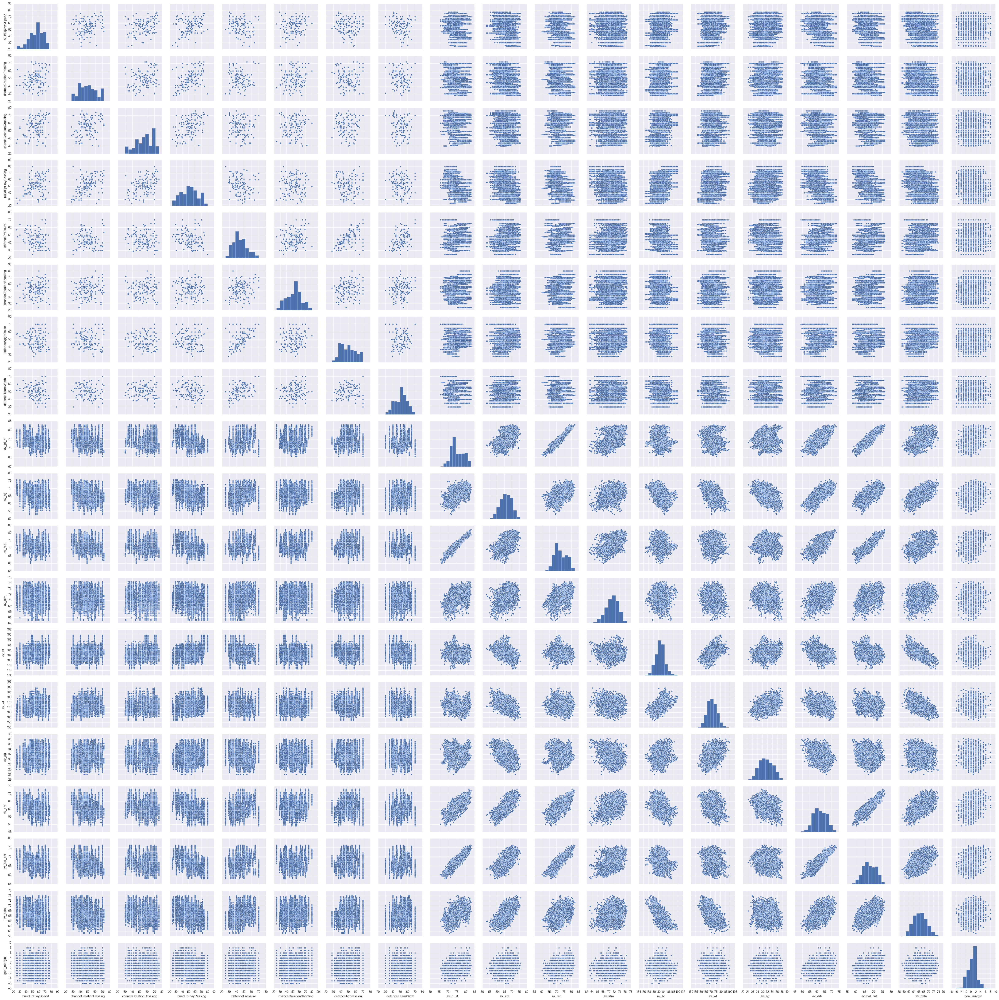

In [46]:
import seaborn as sns
%matplotlib inline
sns.set()
sns.pairplot(mt_plrs)
plt.show

#### Visualization: Boxplot

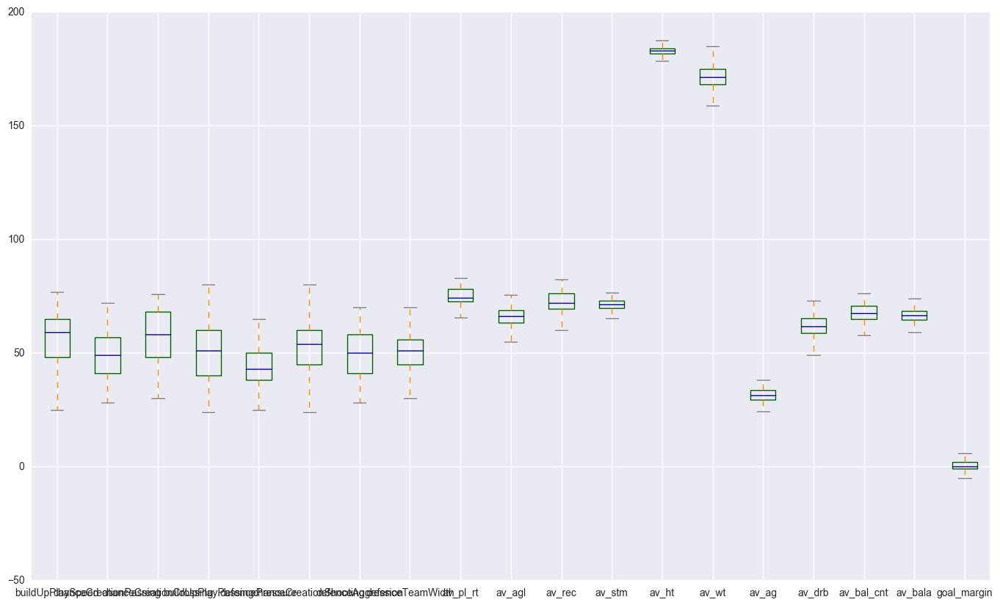

In [47]:
%matplotlib inline
color = dict(boxes='DarkGreen', whiskers='DarkOrange',medians='DarkBlue', caps='Gray')
mt_plrs.plot.box(color=color,figsize=(15, 10), sym='r+')

plt.show()

*The histogram distribution on the scatter matrix above shows most of the features following a normal distribution.*


#### Visualization: the distribution of goal_margin (target)

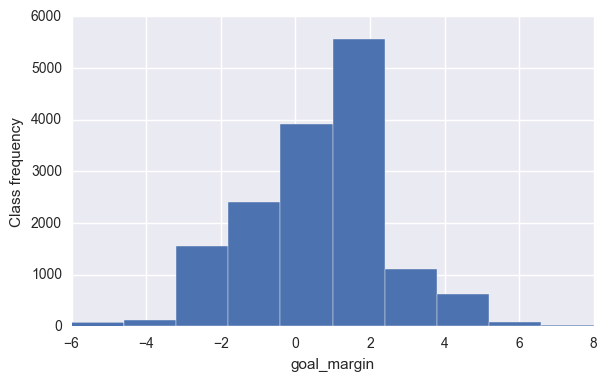

In [48]:
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

plt.hist(mt_plrs.goal_margin)
plt.xlabel('goal_margin')
plt.ylabel('Class frequency')
plt.show()

*The goal margin distribution looks normally distributed for the most part with a slight right skew.<BR>*

## Cross Validation Criteria
The regression study will also use a 10-fold cross validation to split the dataset. The splitted data will be used to cross validate where 80% of the data will be used for training and 20% for 'vaulted' testing. Moreover, we iterate the process of separating the testing and training data ten times.<BR>
 

#### Holding 20% of the data for **testing** using train test split

In [49]:
# import numpy as np
from sklearn.model_selection import train_test_split
X, X_GenTestData, y, y_GenTestData  = train_test_split(
X, y, test_size = 0.2, random_state = 100)
y = y.ravel()
y_GenTestData = y_GenTestData.ravel()
###Checking dimension
## Learning data
print(y.shape)
print(X.shape)
## Data to keep for testing
print(y_GenTestData.shape)
print(X_GenTestData.shape)

(12368,)
(12368, 18)
(3092,)
(3092, 18)


### Stratified 10 Fold Cross Validation

In [50]:
from sklearn.model_selection import StratifiedKFold
skf = StratifiedKFold(n_splits=10)
skf

StratifiedKFold(n_splits=10, random_state=None, shuffle=False)

In [51]:
##Shaping our data 
y=y.ravel()
X=X
print(y.shape)
print(X.shape)

(12368,)
(12368, 18)


## Model Building : Regression 

### A). Random Forest Regression

//anaconda/lib/python3.5/site-packages/sklearn/model_selection/_split.py:581: Warning: The least populated class in y has only 8 members, which is too few. The minimum number of groups for any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)


MAE_test: 0.447210
MAE_GenTestDatat: 0.445390
R-Squared_test is 0.755715380803
R-Squared_GenTestData is 0.73769428303


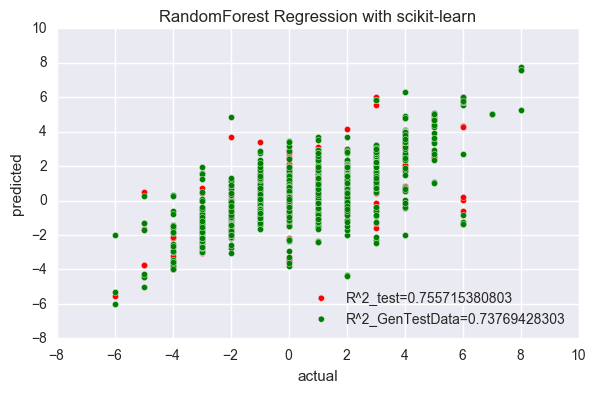

In [52]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import numpy as np
from sklearn import metrics as mt
from sklearn.model_selection import cross_val_predict
import matplotlib.pyplot as plt

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error


clf_rfr = RandomForestRegressor(n_estimators=20)

for train_indices, test_indices in skf.split(X,y): 
    X_train = X[train_indices]
    y_train = y[train_indices]
    X_test = X[test_indices]
    y_test = y[test_indices]
    y_train = y_train.ravel()
    y_test = y_test.ravel()
    clf_rfr.fit(X_train,y_train)
    y_hat_test = clf_rfr.predict(X_test)   
    y_hat_GenTestData=clf_rfr.predict(X_GenTestData)
rsquare_test=r2_score(y_test, y_hat_test)
rsquare_GenTestData=r2_score(y_GenTestData, y_hat_GenTestData)
mae_test = mean_absolute_error(y_test, y_hat_test)
mae_GenTestData = mean_absolute_error(y_GenTestData, y_hat_GenTestData)
print('MAE_test: %f' % mae_test)
print('MAE_GenTestDatat: %f' % mae_GenTestData)
print('R-Squared_test is',rsquare_test)
print('R-Squared_GenTestData is',rsquare_GenTestData)
plt.scatter(y_test, clf_rfr.predict(X_test),label="R^2_test=" + str(rsquare_test), c="r")
plt.scatter(y_GenTestData, clf_rfr.predict(X_GenTestData),label="R^2_GenTestData=" + str(rsquare_GenTestData), c="g")
plt.xlabel('actual')
plt.ylabel('predicted')
plt.legend(loc="lower right")
plt.title("RandomForest Regression with scikit-learn")
plt.ylim(-8, 10)
plt.show()


*The model shows a vague diagonal  relationship. But the variance in the middle seems to be quite wide.<BR>*

### B). KNN Regression

//anaconda/lib/python3.5/site-packages/sklearn/model_selection/_split.py:581: Warning: The least populated class in y has only 8 members, which is too few. The minimum number of groups for any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
//anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


MAE_test: 1.412793
MAE_GenTestData: 1.404359
R-Squared_test is -0.0627909446201
R-Squared_GenTestData is -0.0847995511885


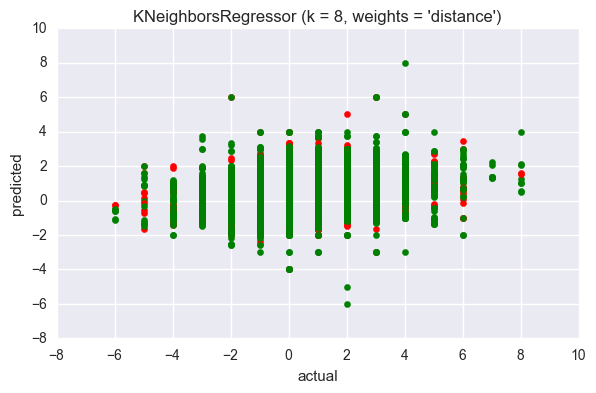

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import neighbors

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
np.random.seed(0)
n_neighbors = 8
X_GenTestData
y_GenTestData

for train_indices, test_indices in skf.split(X,y): 
    X_train = X[train_indices]
    y_train = y[train_indices]
    X_test = X[test_indices]
    y_test = y[test_indices]
    y_train = y_train.ravel()
    y_test = y_test.ravel()

for i, weights in enumerate(['uniform', 'distance']):
    clf_knn = neighbors.KNeighborsRegressor(n_neighbors, weights=weights)
    y_pred_knn_test = clf_knn.fit(X_train, y_train).predict(X_test)
    y_pred_knn_GenTestData=clf_knn.predict(X_GenTestData)
    plt.scatter(y_test, clf_knn.predict(X_test), color="r"  )
    plt.scatter(y_GenTestData, clf_knn.predict(X_GenTestData), color="g"  )
    plt.legend(loc="lower right")
    plt.xlabel('actual')
    plt.ylabel('predicted')
    plt.title("KNeighborsRegressor (k = %i, weights = '%s')" % (n_neighbors, weights))
    plt.ylim(-8, 10)

rsquare_test=r2_score(y_test, y_pred_knn_test)
rsquare_GenTestData=r2_score(y_GenTestData, y_pred_knn_GenTestData)
mae_test = mean_absolute_error(y_test,y_pred_knn_test)
mae_GenTestData = mean_absolute_error(y_GenTestData,y_pred_knn_GenTestData)
print('MAE_test: %f' % mae_test)
print('MAE_GenTestData: %f' % mae_GenTestData)
print('R-Squared_test is',rsquare_test)
print('R-Squared_GenTestData is',rsquare_GenTestData) 

plt.show()

*The variance shown in this model is high. It doesn't look good as the diagonal relationship is missing in the predicted model.<BR>*

### C). Gradient Boosting Regression

//anaconda/lib/python3.5/site-packages/sklearn/model_selection/_split.py:581: Warning: The least populated class in y has only 8 members, which is too few. The minimum number of groups for any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)


MAE_test: 0.4555
MAE_GenTestData: 0.4560
R2_test: 0.7876
R2_GenTestData: 0.7761


//anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


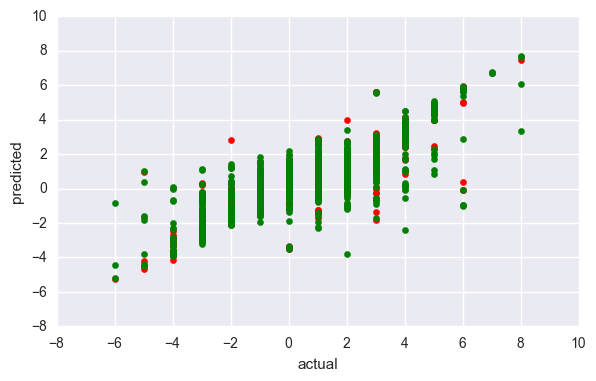

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error,r2_score
from sklearn.ensemble import GradientBoostingRegressor
params = {'n_estimators': 500, 'max_depth': 6,
        'learning_rate': 0.1, 'loss': 'huber','alpha':0.95}
X_GenTestData
y_GenTestData
for train_indices, test_indices in skf.split(X,y): 
    X_train = X[train_indices]
    y_train = y[train_indices]
    X_test = X[test_indices]
    y_test = y[test_indices]
    y_train = y_train.ravel()
    y_test = y_test.ravel()
clf = GradientBoostingRegressor(**params).fit(X_train, y_train)
mae_test = mean_absolute_error(y_test, clf.predict(X_test))
mae_GenTestData = mean_absolute_error(y_GenTestData, clf.predict(X_GenTestData))
r2_test = r2_score(y_test, clf.predict(X_test))
r2_GenTestData = r2_score(y_GenTestData, clf.predict(X_GenTestData))
print("MAE_test: %.4f" % mae_test)
print("MAE_GenTestData: %.4f" % mae_GenTestData)
print("R2_test: %.4f" % r2_test)
print("R2_GenTestData: %.4f" % r2_GenTestData)
fig = plt.figure()
plt.scatter(y_test,clf.predict(X_test), color="r")
plt.scatter(y_GenTestData,clf.predict(X_GenTestData), color="g")
plt.ylim(-8, 10)
plt.xlabel('actual')
plt.ylabel('predicted')
plt.legend(loc='upper left')
plt.show()


*The model displays a somewhat diagonal relationship. Comparatively the variance shows an improvement over the previous models<BR>*

### Mean Absolute Error with 10-Fold Cross Validation - Model Comparison

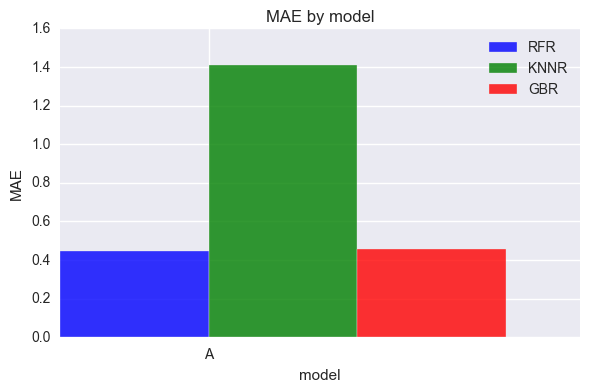

In [59]:
import numpy as np
import matplotlib.pyplot as plt
 
# Mean Absolute error
n_groups = 1
RFR = (0.447210)
KNNR = (1.412793)
GBR = (0.4555)
 
# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.4
opacity = 0.8
 
rects1 = plt.bar(index, RFR, bar_width,
                 alpha=opacity,
                 color='b',
                 label='RFR')
 
rects2 = plt.bar(index + bar_width, KNNR, bar_width,
                 alpha=opacity,
                 color='g',
                 label='KNNR')
rects3 = plt.bar(index + bar_width+bar_width, GBR, bar_width,
                 alpha=opacity,
                 color='r',
                 label='GBR')
 
plt.xlabel('model')
plt.ylabel('MAE')
plt.title('MAE by model')
plt.xticks(index + bar_width, ('A', 'B', 'C', 'D'))
plt.legend()
 
plt.tight_layout()
plt.show()

### Mean Absolute Error against Unseen Data - Model Comparison

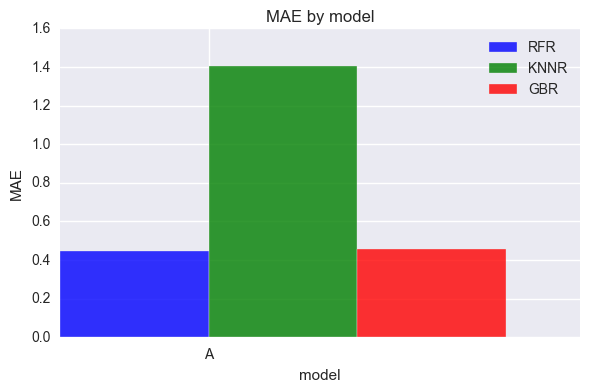

In [60]:
import numpy as np
import matplotlib.pyplot as plt
 
# Mean Absolute error
n_groups = 1
RFR = (0.445390)
KNNR = (1.404359)
GBR = (0.4560)
 
# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.4
opacity = 0.8
 
rects1 = plt.bar(index, RFR, bar_width,
                 alpha=opacity,
                 color='b',
                 label='RFR')
 
rects2 = plt.bar(index + bar_width, KNNR, bar_width,
                 alpha=opacity,
                 color='g',
                 label='KNNR')
rects3 = plt.bar(index + bar_width+bar_width, GBR, bar_width,
                 alpha=opacity,
                 color='r',
                 label='GBR')
 
plt.xlabel('model')
plt.ylabel('MAE')
plt.title('MAE by model')
plt.xticks(index + bar_width, ('A', 'B', 'C', 'D'))
plt.legend()
 
plt.tight_layout()
plt.show()

### Regression Summary

Overall both Random Forest Regression(RFR) and Gradient Boosting Regression(GBR) produced quite competitive models with Random Forest Regression leading by a razer thin margin. Both RFR and GBR models seem to generalize quite well to the vaulted data.


The best evaluator for our regression analysis is <b>Mean Absolute Error (MAE)</b>. There is no absolute criterion for a 'good' value for MAE as it depends on the units by which the variable is measured and on the degree of prediction accuracy. It makes little sense to say 'the model is good or bad' simply by measuring the MAE to a pre-defined value, unless we are referring to a specific degree of accuracy that is relevant to the prediction. The quote below confirms this point of view.

"_Don't split hairs: a model with an RMSE of 3.25 is not significantly better than one with an RMSE of 3.32. It may be useful to think of this in percentage terms: if one model's MAE is 30% lower than another's, that is probably very significant. If it is 10% lower, that is probably somewhat significant. If it is only 2% better, that is probably not significant. These distinctions are especially important when you are trading off model complexity against the error measures: it is probably not worth adding another independent variable to a regression model to decrease the RMSE by only a few more percent._" https://people.duke.edu/~rnau/compare.htm 

Hence when we compare our regression models using MAE, Random Forest regression has relatively low error. While Random Forest performs relatively well with this data, we would need to look for other model comparisons to make a clear distinction for a frontrunner.

R-squared is not a good evaluator for a non-linear model. It is because R-squared is based on the underlying assumption that we are fitting a linear model. For linear models, the sums of the squared errors always add up in a specific manner: SS Regression + SS Error = SS Total. This seems quite logical. The variance that the regression model accounts for plus the error variance adds up to equal the total variance. Furthermore, R-squared equals SS Regression / SS Total, which mathematically must produce a value between 0 and 100.

In non-linear regression, SS Regression + SS Error do not equal SS Total! This invalidates R-squared for nonlinear models, and it no longer has to be between 0 and 100[19]. In our study the R-squared was deemed too unreliable to be considered as a measurement to compare models. 

*Similar to classification task, AdaBoost and Random-Forest both seem to model the goal margin best with the only significant differentiator between the two being the training time taken. <b>As such Random Forest is the regressor that generalizes to this problem the best<span>.*</b><BR>
<BR>
<BR>

## 4. Feature Union(Exceptional)

Feature extraction is another procedure that is susceptible to data leakage. Like data preparation, feature extraction procedures need to be restricted to the data in a training dataset. The pipeline provides a handy tool called the **FeatureUnion** which allows the results of multiple feature selection and extraction procedures to be combined into a larger dataset on which a model can be trained. Importantly, all the feature extraction and the feature union occurs within each fold of the cross validation procedure.
Our code below demonstrates the pipeline defined with four steps:
1. Feature Extraction with Principal Component Analysis (10 features) 
2. Feature Extraction with Statistical Selection (6 features) 
3. Feature Union Learn a Logistic Regression Model 
4. The pipeline is then evaluated using 10-fold cross validation.[20]
5. Calculate Mean Absolute Error and R-Squared on the Vaulted Data

In [57]:
# Create a pipeline that extracts features from the data then creates a model
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest
from sklearn.metrics import mean_absolute_error,r2_score

# create feature union
features = []
features.append(('pca', PCA(n_components=10)))
features.append(('select_best', SelectKBest(k=6)))
feature_union = FeatureUnion(features)

# create pipeline
estimators = []
estimators.append(('feature_union', feature_union))
estimators.append(('logistic', LogisticRegression()))
model = Pipeline(estimators)

# evaluate pipeline
seed = 7
kfold = KFold(n_splits=10, random_state=seed)
results = cross_val_score(model, X, y.ravel(), cv=kfold)
#print(results)

for train_indices, test_indices in kfold.split(X,y.ravel()): 
 X_train = X[train_indices]
 y_train = y[train_indices]    
 X_test = X[test_indices]
 y_test = y[test_indices]
 model.fit(X_train,y_train)
 y_hat = model.predict(X_test)

# Calculate Mean Absolute Error and R-Squared
mae = mean_absolute_error(y_test.ravel(), model.predict(X_test))
r2 = r2_score(y_test.ravel(), model.predict(X_test))
print("MAE: %.4f" % mae)
print("R2: %.4f" % r2)

MAE: 1.3074
R2: 0.0625


*We didn't get better Mean Absolute Error with Feature Union*

## Deployment

The model produced from this study seems to perform quite well on the dataset. When we vaulted a portion of the dataset at the very beginning of the study and used that to validate the already trained classifiers the results produced were of very high accuracy with a good cost score. Based on this alone any party interested in betting on English soccer leagues could potentially use models proposed in this paper to better their odds of a final payoff. 

One could measure the value of the model by independently using it to bet on games on cash-less fantasy leagues and the like. Such testing would provide a risk-free alternative to a potential user to validate the classifiers in their effectiveness and generalizability in real world situations. The model could be deployed commercially as a fee-based service which allowed users to manipulate certain attribute values such as player line-ups etc. to produce a forecast on a game’s outcome. 

Having current accurate underlying data will be critical for the continued success of the model. With Midfield line up having so much influence over the prediction, any change to it needs to be accounted for; And for some cases re-trained.  One would especially need to watch out for sports injuries and how it affects the actual performance verses the expectations based on a now not-so-current player rating and see that the adjustments are accounted for in the model, some re-training might be needed in such cases. If the health of the data and the models are maintained the end classifier could very well be a successful commercial deployment.
<BR>
<BR>

# References 
1. https://www.kaggle.com/hugomathien/soccer
2. https://en.wikipedia.org/wiki/Oldest_football_clubs 
3. https://www.kaggle.com/drgilermo/d/hugomathien/soccer/home-advantage-by-country
4. http://www.football-data.co.uk/notes.txt
5. http://www.scipy-lectures.org/packages/scikit-learn/
6. https://plot.ly/ipython-notebooks/principal-component-analysis/
7. http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html> 
8. http://cmj4.web.rice.edu/SVM.pdf 
9. https://www.cs.cmu.edu/~schneide/tut5/node42.html
10. http://scikit-learn.org/stable/auto_examples/svm/plot_iris.html 
11. http://mines.humanoriented.com/classes/2010/fall/csci568/portfolio_exports/bfindley/KNN.html
12. http://blog.datadive.net/selecting-good-features-part-iii-random-forests/
13. https://www.quora.com/What-are-the-advantages-of-different-classification-algorithms
14. https://github.com/podopie/DAT18NYC/blob/master/classes/13-expected_value_cost_benefit_analysis.ipynb
15. http://scikit-learn.org/stable/modules/neural_networks_supervised.html
16. http://www.fifplay.com/fifa-17-tactics/
17. http://jmlr.csail.mit.edu/papers/volume5/grandvalet04a/grandvalet04a.pdf
18. http://www.livestrong.com/article/528993-what-is-the-number-nine-position-in-soccer/
19. http://blog.minitab.com/blog/adventures-in-statistics-2/why-is-there-no-r-squared-for-nonlinear-regression
20. http://machinelearningmastery.com/automate-machine-learning-workflows-pipelines-python-scikit-learn/

